# DonorsChoose

<p>
DonorsChoose.org receives hundreds of thousands of project proposals each year for classroom projects in need of funding. Right now, a large number of volunteers is needed to manually screen each submission before it's approved to be posted on the DonorsChoose.org website.
</p>
<p>
    Next year, DonorsChoose.org expects to receive close to 500,000 project proposals. As a result, there are three main problems they need to solve:
<ul>
<li>
    How to scale current manual processes and resources to screen 500,000 projects so that they can be posted as quickly and as efficiently as possible</li>
    <li>How to increase the consistency of project vetting across different volunteers to improve the experience for teachers</li>
    <li>How to focus volunteer time on the applications that need the most assistance</li>
    </ul>
</p>    
<p>
The goal of the competition is to predict whether or not a DonorsChoose.org project proposal submitted by a teacher will be approved, using the text of project descriptions as well as additional metadata about the project, teacher, and school. DonorsChoose.org can then use this information to identify projects most likely to need further review before approval.
</p>

## About the DonorsChoose Data Set

The `train.csv` data set provided by DonorsChoose contains the following features:

Feature | Description 
----------|---------------
**`project_id`** | A unique identifier for the proposed project. **Example:** `p036502`   
**`project_title`**    | Title of the project. **Examples:**<br><ul><li><code>Art Will Make You Happy!</code></li><li><code>First Grade Fun</code></li></ul> 
**`project_grade_category`** | Grade level of students for which the project is targeted. One of the following enumerated values: <br/><ul><li><code>Grades PreK-2</code></li><li><code>Grades 3-5</code></li><li><code>Grades 6-8</code></li><li><code>Grades 9-12</code></li></ul>  
 **`project_subject_categories`** | One or more (comma-separated) subject categories for the project from the following enumerated list of values:  <br/><ul><li><code>Applied Learning</code></li><li><code>Care &amp; Hunger</code></li><li><code>Health &amp; Sports</code></li><li><code>History &amp; Civics</code></li><li><code>Literacy &amp; Language</code></li><li><code>Math &amp; Science</code></li><li><code>Music &amp; The Arts</code></li><li><code>Special Needs</code></li><li><code>Warmth</code></li></ul><br/> **Examples:** <br/><ul><li><code>Music &amp; The Arts</code></li><li><code>Literacy &amp; Language, Math &amp; Science</code></li>  
  **`school_state`** | State where school is located ([Two-letter U.S. postal code](https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations#Postal_codes)). **Example:** `WY`
**`project_subject_subcategories`** | One or more (comma-separated) subject subcategories for the project. **Examples:** <br/><ul><li><code>Literacy</code></li><li><code>Literature &amp; Writing, Social Sciences</code></li></ul> 
**`project_resource_summary`** | An explanation of the resources needed for the project. **Example:** <br/><ul><li><code>My students need hands on literacy materials to manage sensory needs!</code</li></ul> 
**`project_essay_1`**    | First application essay<sup>*</sup>  
**`project_essay_2`**    | Second application essay<sup>*</sup> 
**`project_essay_3`**    | Third application essay<sup>*</sup> 
**`project_essay_4`**    | Fourth application essay<sup>*</sup> 
**`project_submitted_datetime`** | Datetime when project application was submitted. **Example:** `2016-04-28 12:43:56.245`   
**`teacher_id`** | A unique identifier for the teacher of the proposed project. **Example:** `bdf8baa8fedef6bfeec7ae4ff1c15c56`  
**`teacher_prefix`** | Teacher's title. One of the following enumerated values: <br/><ul><li><code>nan</code></li><li><code>Dr.</code></li><li><code>Mr.</code></li><li><code>Mrs.</code></li><li><code>Ms.</code></li><li><code>Teacher.</code></li></ul>  
**`teacher_number_of_previously_posted_projects`** | Number of project applications previously submitted by the same teacher. **Example:** `2` 

<sup>*</sup> See the section <b>Notes on the Essay Data</b> for more details about these features.

Additionally, the `resources.csv` data set provides more data about the resources required for each project. Each line in this file represents a resource required by a project:

Feature | Description 
----------|---------------
**`id`** | A `project_id` value from the `train.csv` file.  **Example:** `p036502`   
**`description`** | Desciption of the resource. **Example:** `Tenor Saxophone Reeds, Box of 25`   
**`quantity`** | Quantity of the resource required. **Example:** `3`   
**`price`** | Price of the resource required. **Example:** `9.95`   

**Note:** Many projects require multiple resources. The `id` value corresponds to a `project_id` in train.csv, so you use it as a key to retrieve all resources needed for a project:

The data set contains the following label (the value you will attempt to predict):

Label | Description
----------|---------------
`project_is_approved` | A binary flag indicating whether DonorsChoose approved the project. A value of `0` indicates the project was not approved, and a value of `1` indicates the project was approved.

### Notes on the Essay Data

<ul>
Prior to May 17, 2016, the prompts for the essays were as follows:
<li>__project_essay_1:__ "Introduce us to your classroom"</li>
<li>__project_essay_2:__ "Tell us more about your students"</li>
<li>__project_essay_3:__ "Describe how your students will use the materials you're requesting"</li>
<li>__project_essay_3:__ "Close by sharing why your project will make a difference"</li>
</ul>


<ul>
Starting on May 17, 2016, the number of essays was reduced from 4 to 2, and the prompts for the first 2 essays were changed to the following:<br>
<li>__project_essay_1:__ "Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."</li>
<li>__project_essay_2:__ "About your project: How will these materials make a difference in your students' learning and improve their school lives?"</li>
<br>For all projects with project_submitted_datetime of 2016-05-17 and later, the values of project_essay_3 and project_essay_4 will be NaN.
</ul>


<h1>1. RF and GBDT </h1>

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1.1 Loading Data

In [2]:
project_data = pd.read_csv('train_data.csv',nrows=50000)
resource_data = pd.read_csv('resources.csv')

In [3]:
# print shape of Total data
print("Number of data points in train data", project_data.shape)
print('-'*50)
print("The attributes of data :", project_data.columns.values)



Number of data points in train data (50000, 17)
--------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [4]:
# print top 5 rows of total project data
project_data.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Literacy & Language,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"History & Civics, Health & Sports","Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1
2,21895,p182444,3465aaf82da834c0582ebd0ef8040ca0,Ms.,AZ,2016-08-31 12:03:56,Grades 6-8,Health & Sports,"Health & Wellness, Team Sports",Soccer Equipment for AWESOME Middle School Stu...,"\r\n\""True champions aren't always the ones th...",The students on the campus come to school know...,NaN,NaN,"My students need shine guards, athletic socks,...",1,0
3,45,p246581,f3cb9bffbba169bef1a77b243e620b60,Mrs.,KY,2016-10-06 21:16:17,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Techie Kindergarteners,I work at a unique school filled with both ESL...,My students live in high poverty conditions wi...,NaN,NaN,My students need to engage in Reading and Math...,4,1
4,172407,p104768,be1f7507a41f8479dc06f047086a39ec,Mrs.,TX,2016-07-11 01:10:09,Grades PreK-2,Math & Science,Mathematics,Interactive Math Tools,Our second grade classroom next year will be m...,"For many students, math is a subject that does...",NaN,NaN,My students need hands on practice in mathemat...,1,1


In [5]:
# we get the cost of the project using resource.csv file
resource_data.head(2)

,id,description,quantity,price
0,p233245,LC652 - Lakeshore Double-Space Mobile Drying Rack,1,149.00
1,p069063,Bouncy Bands for Desks (Blue support pipes),3,14.95


In [6]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()
price_data.head(2)

,id,price,quantity
0,p000001,459.56,7
1,p000002,515.89,21


In [7]:
# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

## 1.2 Text Preprocessing

## 1.2.1 Preprocessing: Project_Subject_Categories

In [8]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())

In [9]:
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_subcategories,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,"ESL, Literacy",Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,154.6,23,Literacy_Language
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,"Civics & Government, Team Sports",Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,299.0,1,History_Civics Health_Sports


## 1.2.2 Preprocessing: Project_Subject_Subcategories

In [10]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

In [11]:
project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,My students need opportunities to practice beg...,0,0,154.6,23,Literacy_Language,ESL Literacy
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,My students need a projector to help with view...,7,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports


## 1.2.3 Preprocessing: Project Essays

In [12]:
# merge two column text dataframe: 
project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [13]:
# printing some random reviews
print(project_data['essay'].values[0])
print("="*50)
print(project_data['essay'].values[150])
print("="*50)
print(project_data['essay'].values[1000])
print("="*50)
print(project_data['essay'].values[20000])
print("="*50)

My students are English learners that are working on English as their second or third languages. We are a melting pot of refugees, immigrants, and native-born Americans bringing the gift of language to our school. \r\n\r\n We have over 24 languages represented in our English Learner program with students at every level of mastery.  We also have over 40 countries represented with the families within our school.  Each student brings a wealth of knowledge and experiences to us that open our eyes to new cultures, beliefs, and respect.\"The limits of your language are the limits of your world.\"-Ludwig Wittgenstein  Our English learner's have a strong support system at home that begs for more resources.  Many times our parents are learning to read and speak English along side of their children.  Sometimes this creates barriers for parents to be able to help their child learn phonetics, letter recognition, and other reading skills.\r\n\r\nBy providing these dvd's and players, students are ab

In [14]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [15]:
sent = decontracted(project_data['essay'].values[20000])
print(sent)
print("="*50)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations. \r\n\r\nThe materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills. \r\nThey also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing

In [16]:
# \r \n \t remove from string python: http://texthandler.com/info/remove-line-breaks-python/
sent = sent.replace('\\r', ' ')
sent = sent.replace('\\"', ' ')
sent = sent.replace('\\n', ' ')
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays, cognitive delays, gross/fine motor delays, to autism. They are eager beavers and always strive to work their hardest working past their limitations.     The materials we have are the ones I seek out for my students. I teach in a Title I school where most of the students receive free or reduced price lunch.  Despite their disabilities and limitations, my students love coming to school and come eager to learn and explore.Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting? This is how my kids feel all the time. The want to be able to move as they learn or so they say.Wobble chairs are the answer and I love then because they develop their core, which enhances gross motor and in Turn fine motor skills.   They also want to learn through games, my kids do not want to sit and do worksheets. They want to learn to count by jumping and playing. Phys

In [17]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
print(sent)

My kindergarten students have varied disabilities ranging from speech and language delays cognitive delays gross fine motor delays to autism They are eager beavers and always strive to work their hardest working past their limitations The materials we have are the ones I seek out for my students I teach in a Title I school where most of the students receive free or reduced price lunch Despite their disabilities and limitations my students love coming to school and come eager to learn and explore Have you ever felt like you had ants in your pants and you needed to groove and move as you were in a meeting This is how my kids feel all the time The want to be able to move as they learn or so they say Wobble chairs are the answer and I love then because they develop their core which enhances gross motor and in Turn fine motor skills They also want to learn through games my kids do not want to sit and do worksheets They want to learn to count by jumping and playing Physical engagement is the

In [18]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]

In [19]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████████████████████████████████████████████████████████████████████| 50000/50000 [00:32<00:00, 1531.42it/s]


In [20]:
# after preprocesing
preprocessed_essays[20000]

'kindergarten students varied disabilities ranging speech language delays cognitive delays gross fine motor delays autism eager beavers always strive work hardest working past limitations materials ones seek students teach title school students receive free reduced price lunch despite disabilities limitations students love coming school come eager learn explore ever felt like ants pants needed groove move meeting kids feel time want able move learn say wobble chairs answer love develop core enhances gross motor turn fine motor skills also want learn games kids not want sit worksheets want learn count jumping playing physical engagement key success number toss color shape mats make happen students forget work fun 6 year old deserves nannan'

In [21]:
#add preprocessed_essays in to datafram
project_data['preprocessed_essays'] = preprocessed_essays
project_data.head(2)


,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_essay_4,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay,preprocessed_essays
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,NaN,My students need opportunities to practice beg...,0,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...,students english learners working english seco...
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,NaN,My students need a projector to help with view...,7,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...


<h2><font color='red'> 1.2.4 Preprocessing of `project_title`</font></h2>

In [22]:
#print randomly

print(project_data['project_title'].values[20000])
print("="*50)

We Need To Move It While We Input It!


In [23]:
# Perform text preprocessing for column Project_title

preprocessed_title = []
# tqdm is for printing the status bar
for projectsentence in tqdm(project_data['project_title'].values):
    sentence = decontracted(projectsentence)
    sentence = sentence.replace('\\r', ' ')
    sentence = sentence.replace('\\"', ' ')
    sentence = sentence.replace('\\n', ' ')
    sentence = re.sub('[^A-Za-z0-9]+', ' ', sentence)
    sentence = ' '.join(e1 for e1 in sentence.split() if e1 not in stopwords)
    preprocessed_title.append(sentence.lower().strip())

100%|█████████████████████████████████████████████████████████████████████████| 50000/50000 [00:01<00:00, 35068.92it/s]


In [24]:
#After preprocessing of column Project_title
preprocessed_title[20000]

'we need to move it while we input it'

In [25]:
#add preprocessed_title in to datafram
project_data['preprocessed_title'] = preprocessed_title
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay,preprocessed_essays,preprocessed_title
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,My students need opportunities to practice beg...,0,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...,students english learners working english seco...,educational support english learners home
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,My students need a projector to help with view...,7,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners


## 1.2.5 Preprocessing Teacher_prefix

In [26]:
#Fill null to NAN in teacher_prefix
# pandas change null to nan https://www.geeksforgeeks.org/python-pandas-dataframe-fillna-to-replace-null-values-in-dataframe/

project_data.teacher_prefix.fillna("Nan", inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,...,project_resource_summary,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay,preprocessed_essays,preprocessed_title
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,Mrs.,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",...,My students need opportunities to practice beg...,0,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...,students english learners working english seco...,educational support english learners home
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,Mr.,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,...,My students need a projector to help with view...,7,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners


In [27]:
teacherprefix = list(project_data['teacher_prefix'].values)

teacher_prefix_list = []
for i in teacherprefix:
    temp=""
    temp = i.replace(".","") #replace dot with null and append to prefix list
    teacher_prefix_list.append(temp.strip()) 

In [28]:
project_data['clean_teacher_prefix'] = teacher_prefix_list
project_data.drop(['teacher_prefix'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_grade_category,project_title,project_essay_1,project_essay_2,project_essay_3,...,teacher_number_of_previously_posted_projects,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay,preprocessed_essays,preprocessed_title,clean_teacher_prefix
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Grades PreK-2,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,...,0,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...,students english learners working english seco...,educational support english learners home,Mrs
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Grades 6-8,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,...,7,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners,Mr


## 1.2.6 Preprocessing Project_Grade

In [29]:
clean_grade_catogories = list(project_data['project_grade_category'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_grade_list = []
for i in clean_grade_catogories:
    temp = ""
    temp = i.replace("-","_")
    temp = temp.replace(" ","_")
    sub_grade_list.append(temp.strip())

In [30]:
project_data['clean_grade_catogories'] = sub_grade_list
project_data.drop(['project_grade_category'], axis=1, inplace=True)
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,...,project_is_approved,price,quantity,clean_categories,clean_subcategories,essay,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,...,0,154.6,23,Literacy_Language,ESL Literacy,My students are English learners that are work...,students english learners working english seco...,educational support english learners home,Mrs,Grades_PreK_2
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,...,1,299.0,1,History_Civics Health_Sports,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners,Mr,Grades_6_8


## 1.2.7 Sentiment Scores of each of the Essay

In [31]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sid = SentimentIntensityAnalyzer()

polarity_essays = project_data['essay']
essay_sentiment_neg=[]
essay_sentiment_neu=[]
essay_sentiment_pos=[]
essay_sentiment_compound=[]
for i in tqdm(polarity_essays):
    result = sid.polarity_scores(i)
    essay_sentiment_neg.append(result["neg"])
    essay_sentiment_neu.append(result["neu"])
    essay_sentiment_pos.append(result["pos"])
    essay_sentiment_compound.append(result["compound"])

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [02:44<00:00, 304.04it/s]


In [32]:
project_data['essay_sentiment_neg']=essay_sentiment_neg
project_data['essay_sentiment_neu']=essay_sentiment_neu
project_data['essay_sentiment_pos']=essay_sentiment_pos
project_data['essay_sentiment_compound']=essay_sentiment_compound

In [33]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,...,clean_subcategories,essay,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories,essay_sentiment_neg,essay_sentiment_neu,essay_sentiment_pos,essay_sentiment_compound
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,...,ESL Literacy,My students are English learners that are work...,students english learners working english seco...,educational support english learners home,Mrs,Grades_PreK_2,0.008,0.911,0.081,0.9611
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,...,Civics_Government TeamSports,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners,Mr,Grades_6_8,0.037,0.851,0.112,0.9267


## 1.2.8 Number of words in the title

In [34]:
number_of_words_projecttitle = []
numberofwordsprojecttitle = project_data["preprocessed_title"]
for j in (numberofwordsprojecttitle):
    number_of_words_projecttitle.append(len(j.split()))
project_data['number_of_words_project_title']=number_of_words_projecttitle


In [35]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,...,essay,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories,essay_sentiment_neg,essay_sentiment_neu,essay_sentiment_pos,essay_sentiment_compound,number_of_words_project_title
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,...,My students are English learners that are work...,students english learners working english seco...,educational support english learners home,Mrs,Grades_PreK_2,0.008,0.911,0.081,0.9611,5
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,...,Our students arrive to our school eager to lea...,students arrive school eager learn polite gene...,wanted projector hungry learners,Mr,Grades_6_8,0.037,0.851,0.112,0.9267,4


## 1.2.9 Number of words in combined essays

In [36]:
number_of_words_essay = []
numberofwordsessay = project_data["preprocessed_essays"]
for j in (numberofwordsessay):
    number_of_words_essay.append(len(j.split()))
project_data['number_of_words_essay']=number_of_words_essay

In [37]:
project_data.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_essay_2,project_essay_3,project_essay_4,...,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories,essay_sentiment_neg,essay_sentiment_neu,essay_sentiment_pos,essay_sentiment_compound,number_of_words_project_title,number_of_words_essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,"\""The limits of your language are the limits o...",NaN,NaN,...,students english learners working english seco...,educational support english learners home,Mrs,Grades_PreK_2,0.008,0.911,0.081,0.9611,5,149
1,140945,p258326,897464ce9ddc600bced1151f324dd63a,FL,2016-10-25 09:22:10,Wanted: Projector for Hungry Learners,Our students arrive to our school eager to lea...,The projector we need for our school is very c...,NaN,NaN,...,students arrive school eager learn polite gene...,wanted projector hungry learners,Mr,Grades_6_8,0.037,0.851,0.112,0.9267,4,99


<h1>2. Random Forest and GBDT </h1>

<h2>2.1 Splitting data into Train and cross validation(or test): Stratified Sampling</h2>

In [38]:
# extract data column project_is_approved from total_project_data and add it to variable y
# remove project_is_approved from total_project_data and store the data in to variable X
y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)
project_data.drop(['project_essay_2'], axis=1, inplace=True)
project_data.drop(['project_essay_3'], axis=1, inplace=True)
project_data.drop(['project_essay_4'], axis=1, inplace=True)
X = project_data
X.head(1)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_resource_summary,teacher_number_of_previously_posted_projects,price,...,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories,essay_sentiment_neg,essay_sentiment_neu,essay_sentiment_pos,essay_sentiment_compound,number_of_words_project_title,number_of_words_essay
0,160221,p253737,c90749f5d961ff158d4b4d1e7dc665fc,IN,2016-12-05 13:43:57,Educational Support for English Learners at Home,My students are English learners that are work...,My students need opportunities to practice beg...,0,154.6,...,students english learners working english seco...,educational support english learners home,Mrs,Grades_PreK_2,0.008,0.911,0.081,0.9611,5,149


In [39]:
#split the data in to train and cross validation and test before performing BOW, TFIDF
# train test split
from sklearn.model_selection import train_test_split
#splitting data in to train and test with 33 percentage as test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y)
#splitting train data in to train and cv with 33 percentage as cv data
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train)

In [40]:
#print after split data in to train, cv and test
print("Number of data points in X_train data", X_train.shape)
print('-'*50)
print("Number of data points in X_test data", X_test.shape)
print('-'*50)
print("Number of data points in Y_train data", y_train.shape)
print('-'*50)
print("Number of data points in Y_test data", y_test.shape)
print('-'*50)
print("Number of data points in X_cv data", X_cv.shape)
print('-'*50)
print("Number of data points in Y_cv data", y_cv.shape)
print('-'*50)

Number of data points in X_train data (23450, 24)
--------------------------------------------------
Number of data points in X_test data (15000, 24)
--------------------------------------------------
Number of data points in Y_train data (23450,)
--------------------------------------------------
Number of data points in Y_test data (15000,)
--------------------------------------------------
Number of data points in X_cv data (11550, 24)
--------------------------------------------------
Number of data points in Y_cv data (11550,)
--------------------------------------------------


<h2>2.2 Make Data Model Ready: encoding numerical, categorical features</h2>

### Vectorizing Categorical data

In [41]:
#Function to perform response coding for categorcial features as follows

def ResponseCoding(X,Y,Z):
    totalrecords=0
    recordsforclass0=0
    recordsforclass1=0
    class_0=[]
    class_1=[]
    combined_xy = pd.DataFrame(X)
    combined_xy['class_label']=Y
        
    print (np.array(X))
    for i in tqdm(X):
        #print("")
        if(len(X_train[(X_train[Z] == i)]) >0):
            recordsforclass0 = len(combined_xy[(combined_xy[Z] == i) & (combined_xy['class_label'] == 0)])
            recordsforclass1 = len(combined_xy[(combined_xy[Z] == i) & (combined_xy['class_label'] == 1)])
            totalrecords = recordsforclass0+recordsforclass1
            #print(i)
            #print("print"+str(recordsforclass0))
            #print("print"+str(recordsforclass1))
            #print("print"+str(totalrecords))
            class_0.append(recordsforclass0/totalrecords)
            class_1.append(recordsforclass1/totalrecords)
        else:
            class_0.append(0.5)
            class_1.append(0.05)
    print (class_0,class_1)
    return class_0,class_1
                        

<h3>Encoding categorical feature: School State</h3>

In [42]:
X_train_state_rc = np.array(ResponseCoding(X_train["school_state"],y_train,"school_state"))

  0%|                                                                               | 10/23450 [00:00<04:04, 95.72it/s]

['MO' 'OK' 'SC' ... 'TX' 'OH' 'GA']


100%|████████████████████████████████████████████████████████████████████████████| 23450/23450 [04:09<00:00, 94.07it/s]

[0.1282051282051282, 0.1504950495049505, 0.1404561824729892, 0.1471264367816092, 0.17988252569750368, 0.13812993321190042, 0.1282051282051282, 0.1471264367816092, 0.1504950495049505, 0.1487481590574374, 0.13812993321190042, 0.12956810631229235, 0.16906474820143885, 0.1504950495049505, 0.12296564195298372, 0.13812993321190042, 0.12956810631229235, 0.1362962962962963, 0.1362962962962963, 0.13812993321190042, 0.17988252569750368, 0.12296564195298372, 0.09904761904761905, 0.1487481590574374, 0.16954022988505746, 0.13812993321190042, 0.16954022988505746, 0.12296564195298372, 0.1565217391304348, 0.17988252569750368, 0.1471264367816092, 0.09904761904761905, 0.1471264367816092, 0.17440543601359004, 0.1501577287066246, 0.1487481590574374, 0.2109623964308477, 0.16954022988505746, 0.17440543601359004, 0.13812993321190042, 0.1501577287066246, 0.12956810631229235, 0.13812993321190042, 0.1565217391304348, 0.13721973094170403, 0.1501577287066246, 0.1404561824729892, 0.1404561824729892, 0.163498098859

In [43]:
X_cv_state_rc = np.array(ResponseCoding(X_cv["school_state"],y_cv,"school_state"))
len(X_cv_state_rc)

  0%|                                                                              | 11/11550 [00:00<01:50, 104.29it/s]

['NY' 'CA' 'AL' ... 'VA' 'PA' 'GA']


100%|███████████████████████████████████████████████████████████████████████████| 11550/11550 [01:44<00:00, 110.21it/s]

[0.13659793814432988, 0.15210751374465487, 0.12886597938144329, 0.18292682926829268, 0.13924050632911392, 0.15210751374465487, 0.18393782383419688, 0.12012987012987013, 0.12403100775193798, 0.13659793814432988, 0.15671641791044777, 0.17160686427457097, 0.1751412429378531, 0.12012987012987013, 0.1111111111111111, 0.15210751374465487, 0.13659793814432988, 0.2, 0.15210751374465487, 0.15210751374465487, 0.12012987012987013, 0.16336633663366337, 0.1076923076923077, 0.17160686427457097, 0.17058823529411765, 0.17662337662337663, 0.17160686427457097, 0.18584070796460178, 0.18120805369127516, 0.13659793814432988, 0.17160686427457097, 0.13302752293577982, 0.1506849315068493, 0.15210751374465487, 0.17662337662337663, 0.18292682926829268, 0.17160686427457097, 0.18393782383419688, 0.22131147540983606, 0.18181818181818182, 0.22131147540983606, 0.1751412429378531, 0.15210751374465487, 0.21428571428571427, 0.12012987012987013, 0.13302752293577982, 0.15283842794759825, 0.1751412429378531, 0.18584070796

2

In [44]:
X_test_state_rc = np.array(ResponseCoding(X_test["school_state"],y_test,"school_state"))
len(X_cv_state_rc)

  0%|                                                                                | 9/15000 [00:00<02:50, 87.77it/s]

['FL' 'CA' 'WI' ... 'MA' 'PA' 'CA']


100%|███████████████████████████████████████████████████████████████████████████| 15000/15000 [02:23<00:00, 104.70it/s]

[0.18660287081339713, 0.14667940754897277, 0.16317991631799164, 0.12225705329153605, 0.14667940754897277, 0.134185303514377, 0.18660287081339713, 0.17102966841186737, 0.14147286821705427, 0.13468013468013468, 0.15789473684210525, 0.18660287081339713, 0.175, 0.14667940754897277, 0.1286549707602339, 0.1286549707602339, 0.1323529411764706, 0.15789473684210525, 0.18660287081339713, 0.14667940754897277, 0.14147286821705427, 0.134185303514377, 0.13468013468013468, 0.14666666666666667, 0.2553191489361702, 0.18181818181818182, 0.18181818181818182, 0.13688212927756654, 0.18660287081339713, 0.1746031746031746, 0.16121495327102803, 0.134185303514377, 0.134185303514377, 0.14147286821705427, 0.15789473684210525, 0.2028985507246377, 0.2159090909090909, 0.15789473684210525, 0.134185303514377, 0.23255813953488372, 0.17102966841186737, 0.18181818181818182, 0.18181818181818182, 0.14147286821705427, 0.13802816901408452, 0.18181818181818182, 0.16911764705882354, 0.17011494252873563, 0.14798206278026907, 0

2

<h3>Encoding categorical feature: Teacher_prefix State</h3>

In [45]:
#Perform response coding to Teacher prefix

X_train_teacher_rc = np.array(ResponseCoding(X_train["clean_teacher_prefix"],y_train,"clean_teacher_prefix"))
X_cv_teacher_rc = np.array(ResponseCoding(X_cv["clean_teacher_prefix"],y_cv,"clean_teacher_prefix"))
X_test_teacher_rc = np.array(ResponseCoding(X_test["clean_teacher_prefix"],y_test,"clean_teacher_prefix"))
len(X_test_teacher_rc)

  0%|                                                                                | 4/23450 [00:00<10:41, 36.57it/s]

['Mrs' 'Ms' 'Ms' ... 'Mrs' 'Mrs' 'Ms']


  0%|                                                                                | 5/11550 [00:00<04:30, 42.67it/s]

[0.14816933638443935, 0.1584847769648336, 0.1584847769648336, 0.14816933638443935, 0.18404907975460122, 0.14816933638443935, 0.1584847769648336, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.1584847769648336, 0.14816933638443935, 0.14816933638443935, 0.1584847769648336, 0.14816933638443935, 0.14816933638443935, 0.16525988449577966, 0.1584847769648336, 0.1584847769648336, 0.14816933638443935, 0.1584847769648336, 0.1584847769648336, 0.1584847769648336, 0.14816933638443935, 0.1584847769648336, 0.1584847769648336, 0.16525988449577966, 0.1584847769648336, 0.1584847769648336, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.14816933638443935, 0.1584847769648336, 0.1584847769648336, 0.1584847769648336, 0.14816933638443935, 0.1584847769648336, 0.16525988449577966, 0.1584847769648336, 0.14816933638443935, 0.1584847769648336, 0.1584847769648336, 0.16525988449577966, 0.14816933638443935, 0.1584847769

  0%|                                                                                | 4/15000 [00:00<06:24, 39.02it/s]

[0.15024018552261056, 0.15024018552261056, 0.15024018552261056, 0.1555609401502302, 0.15024018552261056, 0.1555609401502302, 0.16024518388791595, 0.16024518388791595, 0.15024018552261056, 0.1555609401502302, 0.2024793388429752, 0.1555609401502302, 0.1555609401502302, 0.15024018552261056, 0.15024018552261056, 0.16024518388791595, 0.1555609401502302, 0.15024018552261056, 0.16024518388791595, 0.16024518388791595, 0.15024018552261056, 0.1555609401502302, 0.1555609401502302, 0.15024018552261056, 0.16024518388791595, 0.16024518388791595, 0.15024018552261056, 0.2024793388429752, 0.15024018552261056, 0.16024518388791595, 0.15024018552261056, 0.1555609401502302, 0.15024018552261056, 0.15024018552261056, 0.15024018552261056, 0.15024018552261056, 0.1555609401502302, 0.1555609401502302, 0.15024018552261056, 0.15024018552261056, 0.1555609401502302, 0.15024018552261056, 0.1555609401502302, 0.16024518388791595, 0.15024018552261056, 0.15024018552261056, 0.15024018552261056, 0.15024018552261056, 0.1502

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [05:43<00:00, 43.67it/s]

[0.1550140581068416, 0.15012075759501717, 0.1550140581068416, 0.15012075759501717, 0.1550140581068416, 0.1550140581068416, 0.15012075759501717, 0.22727272727272727, 0.1550140581068416, 0.15012075759501717, 0.15012075759501717, 0.1550140581068416, 0.15757162346521145, 0.1550140581068416, 0.15012075759501717, 0.15012075759501717, 0.15757162346521145, 0.15012075759501717, 0.15012075759501717, 0.15012075759501717, 0.15757162346521145, 0.15012075759501717, 0.1550140581068416, 0.1550140581068416, 0.15012075759501717, 0.15012075759501717, 0.15757162346521145, 0.15757162346521145, 0.1550140581068416, 0.1550140581068416, 0.1550140581068416, 0.1550140581068416, 0.15012075759501717, 0.1550140581068416, 0.15012075759501717, 0.15757162346521145, 0.15012075759501717, 0.15757162346521145, 0.1550140581068416, 0.15012075759501717, 0.15012075759501717, 0.1550140581068416, 0.1550140581068416, 0.1550140581068416, 0.15012075759501717, 0.15012075759501717, 0.1550140581068416, 0.15757162346521145, 0.15501405

2

<h3>Encoding categorical feature: Project Grade Category</h3>

In [46]:
#Perform response coding to Project Grade Category

X_train_grade_rc = np.array(ResponseCoding(X_train["clean_grade_catogories"],y_train,"clean_grade_catogories"))
X_cv_grade_rc = np.array(ResponseCoding(X_cv["clean_grade_catogories"],y_cv,"clean_grade_catogories"))
X_test_grade_rc = np.array(ResponseCoding(X_test["clean_grade_catogories"],y_test,"clean_grade_catogories"))

len(X_test_grade_rc)

  0%|                                                                                | 5/23450 [00:00<09:27, 41.29it/s]

['Grades_6_8' 'Grades_3_5' 'Grades_3_5' ... 'Grades_6_8' 'Grades_PreK_2'
 'Grades_PreK_2']


  0%|                                                                                | 5/11550 [00:00<04:01, 47.85it/s]

[0.16875681570338058, 0.14327522585570684, 0.14327522585570684, 0.14327522585570684, 0.152872240242754, 0.152872240242754, 0.152872240242754, 0.16875681570338058, 0.16875681570338058, 0.16875681570338058, 0.16875681570338058, 0.152872240242754, 0.152872240242754, 0.152872240242754, 0.16875681570338058, 0.17413355874894337, 0.152872240242754, 0.14327522585570684, 0.14327522585570684, 0.17413355874894337, 0.14327522585570684, 0.152872240242754, 0.16875681570338058, 0.152872240242754, 0.152872240242754, 0.14327522585570684, 0.16875681570338058, 0.152872240242754, 0.17413355874894337, 0.16875681570338058, 0.17413355874894337, 0.14327522585570684, 0.152872240242754, 0.16875681570338058, 0.152872240242754, 0.152872240242754, 0.16875681570338058, 0.14327522585570684, 0.16875681570338058, 0.152872240242754, 0.152872240242754, 0.14327522585570684, 0.152872240242754, 0.152872240242754, 0.152872240242754, 0.14327522585570684, 0.152872240242754, 0.152872240242754, 0.152872240242754, 0.152872240242

  0%|                                                                                | 5/15000 [00:00<05:25, 46.03it/s]

[0.1560705932383585, 0.15172239108409322, 0.1560705932383585, 0.15453527435610304, 0.15172239108409322, 0.15172239108409322, 0.1560705932383585, 0.15453527435610304, 0.15172239108409322, 0.1560705932383585, 0.1560705932383585, 0.15453527435610304, 0.1560705932383585, 0.1560705932383585, 0.1560705932383585, 0.15172239108409322, 0.1560705932383585, 0.1560705932383585, 0.15453527435610304, 0.1554357592093441, 0.1560705932383585, 0.1560705932383585, 0.15453527435610304, 0.1560705932383585, 0.1554357592093441, 0.15453527435610304, 0.1560705932383585, 0.1560705932383585, 0.1560705932383585, 0.15453527435610304, 0.1560705932383585, 0.15172239108409322, 0.15172239108409322, 0.15172239108409322, 0.15453527435610304, 0.1560705932383585, 0.1560705932383585, 0.15172239108409322, 0.1560705932383585, 0.1560705932383585, 0.15453527435610304, 0.15172239108409322, 0.15172239108409322, 0.15453527435610304, 0.15172239108409322, 0.15172239108409322, 0.1554357592093441, 0.1560705932383585, 0.15607059323835

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [05:13<00:00, 47.88it/s]

[0.15055221856229412, 0.154557463672391, 0.154557463672391, 0.15055221856229412, 0.154557463672391, 0.15331010452961671, 0.154557463672391, 0.154557463672391, 0.15331010452961671, 0.15055221856229412, 0.15331010452961671, 0.154557463672391, 0.15055221856229412, 0.154557463672391, 0.15055221856229412, 0.154557463672391, 0.15331010452961671, 0.15055221856229412, 0.15055221856229412, 0.15055221856229412, 0.15331010452961671, 0.16745124411566914, 0.15055221856229412, 0.15055221856229412, 0.154557463672391, 0.154557463672391, 0.15055221856229412, 0.15055221856229412, 0.16745124411566914, 0.154557463672391, 0.15055221856229412, 0.154557463672391, 0.154557463672391, 0.15331010452961671, 0.154557463672391, 0.154557463672391, 0.154557463672391, 0.16745124411566914, 0.15331010452961671, 0.15055221856229412, 0.15055221856229412, 0.154557463672391, 0.15055221856229412, 0.154557463672391, 0.154557463672391, 0.15055221856229412, 0.16745124411566914, 0.154557463672391, 0.15055221856229412, 0.15455746

2

<h3>Encoding categorical feature: Project Categories</h3>

In [47]:
#Perform response coding to Project Categories

X_train_cleanc_rc = np.array(ResponseCoding(X_train["clean_categories"],y_train,"clean_categories"))
X_cv_cleanc_rc = np.array(ResponseCoding(X_cv["clean_categories"],y_cv,"clean_categories"))
X_test_cleanc_rc = np.array(ResponseCoding(X_test["clean_categories"],y_test,"clean_categories"))

len(X_test_cleanc_rc)

  0%|                                                                                | 7/23450 [00:00<06:19, 61.80it/s]

['Literacy_Language' 'AppliedLearning' 'Math_Science' ...
 'Literacy_Language' 'Literacy_Language Math_Science'
 'Literacy_Language Math_Science']


  0%|                                                                                | 8/11550 [00:00<02:37, 73.18it/s]

[0.13630150361257568, 0.201765447667087, 0.17325483599663583, 0.14285714285714285, 0.14285714285714285, 0.15877311682453765, 0.15877311682453765, 0.1356255969436485, 0.13630150361257568, 0.17325483599663583, 0.17325483599663583, 0.1356255969436485, 0.13630150361257568, 0.14285714285714285, 0.13812154696132597, 0.201765447667087, 0.1356255969436485, 0.14285714285714285, 0.13630150361257568, 0.1960352422907489, 0.13812154696132597, 0.18674698795180722, 0.17325483599663583, 0.13630150361257568, 0.17325483599663583, 0.1356255969436485, 0.13630150361257568, 0.1960352422907489, 0.14981949458483754, 0.1820580474934037, 0.13630150361257568, 0.14981949458483754, 0.10774410774410774, 0.13630150361257568, 0.1960352422907489, 0.182370820668693, 0.14981949458483754, 0.1356255969436485, 0.15877311682453765, 0.13812154696132597, 0.1356255969436485, 0.13630150361257568, 0.06451612903225806, 0.1960352422907489, 0.14285714285714285, 0.15877311682453765, 0.1960352422907489, 0.1356255969436485, 0.13630150

  0%|                                                                                | 7/15000 [00:00<03:38, 68.48it/s]

[0.128520428401428, 0.128520428401428, 0.13082901554404144, 0.15402298850574714, 0.13082901554404144, 0.24043715846994534, 0.128520428401428, 0.17708333333333334, 0.14986376021798364, 0.18518518518518517, 0.13082901554404144, 0.1875699888017917, 0.13082901554404144, 0.1858974358974359, 0.128520428401428, 0.1368421052631579, 0.0661764705882353, 0.128520428401428, 0.24043715846994534, 0.2553191489361702, 0.14986376021798364, 0.18157181571815717, 0.1875699888017917, 0.14986376021798364, 0.14986376021798364, 0.1368421052631579, 0.128520428401428, 0.13082901554404144, 0.20689655172413793, 0.13082901554404144, 0.13082901554404144, 0.16417910447761194, 0.0, 0.18157181571815717, 0.24043715846994534, 0.12903225806451613, 0.20535714285714285, 0.128520428401428, 0.1875699888017917, 0.1875699888017917, 0.24043715846994534, 0.13082901554404144, 0.16, 0.128520428401428, 0.24043715846994534, 0.128520428401428, 0.1875699888017917, 0.14925373134328357, 0.14986376021798364, 0.128520428401428, 0.18756998

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [03:37<00:00, 68.96it/s]

[0.14033485540334856, 0.18573868488471393, 0.17953321364452424, 0.18867924528301888, 0.14978292329956586, 0.14033485540334856, 0.14033485540334856, 0.14563106796116504, 0.25, 0.14978292329956586, 0.18573868488471393, 0.13465346534653466, 0.13465346534653466, 0.18803418803418803, 0.15151515151515152, 0.13465346534653466, 0.18573868488471393, 0.14655172413793102, 0.13465346534653466, 0.17452006980802792, 0.14473684210526316, 0.134375, 0.18573868488471393, 0.14033485540334856, 0.17953321364452424, 0.18573868488471393, 0.14033485540334856, 0.17953321364452424, 0.17452006980802792, 0.13465346534653466, 0.18573868488471393, 0.14033485540334856, 0.14033485540334856, 0.17452006980802792, 0.13465346534653466, 0.13465346534653466, 0.13465346534653466, 0.18573868488471393, 0.2, 0.18573868488471393, 0.14033485540334856, 0.14978292329956586, 0.14033485540334856, 0.17452006980802792, 0.13465346534653466, 0.14655172413793102, 0.14754098360655737, 0.13676470588235295, 0.14033485540334856, 0.134375, 0.

2

<h3>Encoding categorical feature: Project Sub Categories</h3>

In [48]:
#Perform response coding to Project Sub Categories

X_train_cleansub_rc = np.array(ResponseCoding(X_train["clean_subcategories"],y_train,"clean_subcategories"))
X_cv_cleansub_rc = np.array(ResponseCoding(X_cv["clean_subcategories"],y_cv,"clean_subcategories"))
X_test_cleansub_rc = np.array(ResponseCoding(X_test["clean_subcategories"],y_test,"clean_subcategories"))

len(X_test_cleansub_rc)

  0%|                                                                                | 8/23450 [00:00<05:23, 72.48it/s]

['Literacy Literature_Writing' 'CharacterEducation College_CareerPrep'
 'AppliedSciences Mathematics' ... 'ESL Literature_Writing'
 'Literacy Mathematics' 'Literature_Writing Mathematics']


  0%|                                                                                | 9/11550 [00:00<02:08, 89.50it/s]

[0.14870509607351712, 0.125, 0.15633423180592992, 0.12355212355212356, 0.12355212355212356, 0.1144578313253012, 0.1144578313253012, 0.12624584717607973, 0.17261904761904762, 0.14545454545454545, 0.17312894499549145, 0.14726840855106887, 0.1085383502170767, 0.1718213058419244, 0.15217391304347827, 0.125, 0.12624584717607973, 0.12355212355212356, 0.14870509607351712, 0.1960352422907489, 0.10666666666666667, 0.16666666666666666, 0.17727272727272728, 0.14870509607351712, 0.17312894499549145, 0.14726840855106887, 0.14870509607351712, 0.1960352422907489, 0.14354066985645933, 0.22972972972972974, 0.16470588235294117, 0.1759656652360515, 0.13385826771653545, 0.14870509607351712, 0.1960352422907489, 0.14942528735632185, 0.11400651465798045, 0.14726840855106887, 0.1862348178137652, 0.15217391304347827, 0.12624584717607973, 0.1085383502170767, 0.08, 0.1960352422907489, 0.12355212355212356, 0.13540372670807455, 0.1960352422907489, 0.14726840855106887, 0.16470588235294117, 0.12624584717607973, 0.10

  0%|                                                                                | 9/15000 [00:00<02:47, 89.45it/s]

[0.10970873786407767, 0.12864493996569468, 0.1351039260969977, 0.12222222222222222, 0.12577639751552794, 0.41818181818181815, 0.10344827586206896, 0.208, 0.17857142857142858, 0.18518518518518517, 0.1351039260969977, 0.18388791593695272, 0.1351039260969977, 0.16666666666666666, 0.12864493996569468, 0.13253012048192772, 0.0661764705882353, 0.10970873786407767, 0.15, 0.3333333333333333, 0.14615384615384616, 0.2222222222222222, 0.12087912087912088, 0.14615384615384616, 0.1875, 0.18, 0.10970873786407767, 0.1351039260969977, 0.22413793103448276, 0.1351039260969977, 0.1351039260969977, 0.125, 0.0, 0.1348314606741573, 0.5, 0.0, 0.08695652173913043, 0.10970873786407767, 0.1891891891891892, 0.18388791593695272, 0.15789473684210525, 0.12577639751552794, 0.16666666666666666, 0.12864493996569468, 0.3333333333333333, 0.12864493996569468, 0.2063953488372093, 0.17391304347826086, 0.12601626016260162, 0.17118997912317327, 0.2063953488372093, 0.1891891891891892, 0.10970873786407767, 0.1351039260969977, 

100%|████████████████████████████████████████████████████████████████████████████| 15000/15000 [02:59<00:00, 83.69it/s]

[0.15066225165562913, 0.1721419185282523, 0.18181818181818182, 0.20253164556962025, 0.1296928327645051, 0.12658227848101267, 0.13298271975957926, 0.17073170731707318, 0.3333333333333333, 0.12050739957716702, 0.1797752808988764, 0.13092161929371232, 0.13408521303258145, 0.19736842105263158, 0.1, 0.13092161929371232, 0.19672131147540983, 0.16666666666666666, 0.13408521303258145, 0.17452006980802792, 0.14492753623188406, 0.14285714285714285, 0.1721419185282523, 0.12658227848101267, 0.18181818181818182, 0.1721419185282523, 0.12658227848101267, 0.23076923076923078, 0.17452006980802792, 0.13408521303258145, 0.17832957110609482, 0.15932203389830507, 0.13298271975957926, 0.17452006980802792, 0.13092161929371232, 0.13408521303258145, 0.13092161929371232, 0.189873417721519, 0.2, 0.19672131147540983, 0.15932203389830507, 0.2558139534883721, 0.15066225165562913, 0.17452006980802792, 0.13092161929371232, 0.10256410256410256, 0.12222222222222222, 0.1076923076923077, 0.15066225165562913, 0.1142857142

2

<h3>Encoding Numerical Feature: Teacher Number of Previously Posted </h3>

In [49]:
X_train.head(2)

,Unnamed: 0,id,teacher_id,school_state,project_submitted_datetime,project_title,project_essay_1,project_resource_summary,teacher_number_of_previously_posted_projects,price,...,preprocessed_essays,preprocessed_title,clean_teacher_prefix,clean_grade_catogories,essay_sentiment_neg,essay_sentiment_neu,essay_sentiment_pos,essay_sentiment_compound,number_of_words_project_title,number_of_words_essay
9937,82674,p169757,77ede6a0de7d971afe4ac2f474b36cbd,MO,2016-06-08 15:47:31,Expanding Our Reading with Storyworks!,I teach a variety of learners; some are eager ...,My students need Storyworks magazine from Scho...,2,7.49,...,teach variety learners eager learn others need...,expanding our reading storyworks,Mrs,Grades_6_8,0.034,0.875,0.091,0.9062,4,93
30499,1888,p259373,831e190201c1a6b2bc3619148c82f36b,OK,2017-01-14 16:00:51,Help Us Get Our Time Organized!,My students are between 9 and 11 years of age;...,My students need planners to help them organiz...,2,9.29,...,students 9 11 years age majority students mino...,help us get our time organized,Ms,Grades_3_5,0.029,0.873,0.098,0.9342,6,126


In [50]:
#Standardize numberical feature : Teacher Number of previously posted projects
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_teacherposted_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_cv_teacherposted_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_test_teacherposted_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

print("After vectorizations")
print(X_train_teacherposted_norm.shape, y_train.shape)
print(X_cv_teacherposted_norm.shape, y_cv.shape)
print(X_test_teacherposted_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)


<h3>Encoding Numerical Feature: Essay Sentiment neg,neu,pos,compound </h3>

In [51]:
#Standardize numberical feature : essay sentiment neg
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['essay_sentiment_neg'].values.reshape(1,-1))

X_train_essay_sentiment_neg = normalizer.transform(X_train['essay_sentiment_neg'].values.reshape(1,-1))
X_cv_essay_sentiment_neg = normalizer.transform(X_cv['essay_sentiment_neg'].values.reshape(1,-1))
X_test_essay_sentiment_neg = normalizer.transform(X_test['essay_sentiment_neg'].values.reshape(1,-1))

print("neg After vectorizations")
print(X_train_essay_sentiment_neg.shape, y_train.shape)
print(X_cv_essay_sentiment_neg.shape, y_cv.shape)
print(X_test_essay_sentiment_neg.shape, y_test.shape)
print("="*100)



#Standardize numberical feature : essay sentiment neu

normalizer = Normalizer()
normalizer.fit(X_train['essay_sentiment_neu'].values.reshape(1,-1))

X_train_essay_sentiment_neu = normalizer.transform(X_train['essay_sentiment_neu'].values.reshape(1,-1))
X_cv_essay_sentiment_neu = normalizer.transform(X_cv['essay_sentiment_neu'].values.reshape(1,-1))
X_test_essay_sentiment_neu = normalizer.transform(X_test['essay_sentiment_neu'].values.reshape(1,-1))

print("neu After vectorizations")
print(X_train_essay_sentiment_neu.shape, y_train.shape)
print(X_cv_essay_sentiment_neu.shape, y_cv.shape)
print(X_test_essay_sentiment_neu.shape, y_test.shape)
print("="*100)

#Standardize numberical feature : essay sentiment pos

normalizer = Normalizer()
normalizer.fit(X_train['essay_sentiment_pos'].values.reshape(1,-1))

X_train_essay_sentiment_pos = normalizer.transform(X_train['essay_sentiment_pos'].values.reshape(1,-1))
X_cv_essay_sentiment_pos = normalizer.transform(X_cv['essay_sentiment_pos'].values.reshape(1,-1))
X_test_essay_sentiment_pos = normalizer.transform(X_test['essay_sentiment_pos'].values.reshape(1,-1))

print("pos After vectorizations")
print(X_train_essay_sentiment_pos.shape, y_train.shape)
print(X_cv_essay_sentiment_pos.shape, y_cv.shape)
print(X_test_essay_sentiment_pos.shape, y_test.shape)
print("="*100)


#Standardize numberical feature : essay sentiment compound
normalizer = Normalizer()
normalizer.fit(X_train['essay_sentiment_compound'].values.reshape(1,-1))

X_train_essay_sentiment_compound = normalizer.transform(X_train['essay_sentiment_compound'].values.reshape(1,-1))
X_cv_essay_sentiment_compound = normalizer.transform(X_cv['essay_sentiment_compound'].values.reshape(1,-1))
X_test_essay_sentiment_compound = normalizer.transform(X_test['essay_sentiment_compound'].values.reshape(1,-1))

print("compound After vectorizations")
print(X_train_essay_sentiment_compound.shape, y_train.shape)
print(X_cv_essay_sentiment_compound.shape, y_cv.shape)
print(X_test_essay_sentiment_compound.shape, y_test.shape)
print("="*100)

neg After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)
neu After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)
pos After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)
compound After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)


<h3>Encoding Numerical Feature: Number of words in title and combine essays </h3>

In [52]:
#Standardize numberical feature : essay sentiment neg
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
normalizer.fit(X_train['number_of_words_project_title'].values.reshape(1,-1))

X_train_number_of_words_project_title = normalizer.transform(X_train['number_of_words_project_title'].values.reshape(1,-1))
X_cv_number_of_words_project_title = normalizer.transform(X_cv['number_of_words_project_title'].values.reshape(1,-1))
X_test_number_of_words_project_title = normalizer.transform(X_test['number_of_words_project_title'].values.reshape(1,-1))

print("Number of words in project title After vectorizations")
print(X_train_number_of_words_project_title.shape, y_train.shape)
print(X_cv_number_of_words_project_title.shape, y_cv.shape)
print(X_test_number_of_words_project_title.shape, y_test.shape)
print("="*100)



#Standardize numberical feature : number of words in essay

normalizer = Normalizer()
normalizer.fit(X_train['number_of_words_essay'].values.reshape(1,-1))

X_train_number_of_words_essay = normalizer.transform(X_train['number_of_words_essay'].values.reshape(1,-1))
X_cv_number_of_words_essay = normalizer.transform(X_cv['number_of_words_essay'].values.reshape(1,-1))
X_test_number_of_words_essay = normalizer.transform(X_test['number_of_words_essay'].values.reshape(1,-1))

print("Number of words in Essay After vectorizations")
print(X_train_number_of_words_essay.shape, y_train.shape)
print(X_cv_number_of_words_essay.shape, y_cv.shape)
print(X_test_number_of_words_essay.shape, y_test.shape)
print("="*100)



Number of words in project title After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)
Number of words in Essay After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)


<h2>2.3 Make Data Model Ready: encoding eassay, and project_title</h2>

<h3>Vectorizing Text data</h3>

<h3>Encoding Text data: Project Essay (BOW) </h3>

In [53]:
#Perform BOW on Preprocessed Essay feature

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer.fit(X_train['preprocessed_essays'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vectorizer.transform(X_train['preprocessed_essays'].values)
X_cv_essay_bow = vectorizer.transform(X_cv['preprocessed_essays'].values)
X_test_essay_bow = vectorizer.transform(X_test['preprocessed_essays'].values)

print("After vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_cv_essay_bow.shape, y_cv.shape)
print(X_test_essay_bow.shape, y_test.shape)
print("="*100)

(23450, 24) (23450,)
(11550, 24) (11550,)
(15000, 24) (15000,)
After vectorizations
(23450, 5000) (23450,)
(11550, 5000) (11550,)
(15000, 5000) (15000,)


<h3>Encoding Text data: Project_title (BOW) </h3>

In [54]:
#Perform BOW on Project Title feature

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = CountVectorizer(min_df=10,ngram_range=(1,4), max_features = 5000)
vectorizer.fit(X_train['preprocessed_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_pt_bow = vectorizer.transform(X_train['preprocessed_title'].values)
X_cv_pt_bow = vectorizer.transform(X_cv['preprocessed_title'].values)
X_test_pt_bow = vectorizer.transform(X_test['preprocessed_title'].values)

print("After vectorizations")
print(X_train_pt_bow.shape, y_train.shape)
print(X_cv_pt_bow.shape, y_cv.shape)
print(X_test_pt_bow.shape, y_test.shape)
print("="*100)

(23450, 24) (23450,)
(11550, 24) (11550,)
(15000, 24) (15000,)
After vectorizations
(23450, 2043) (23450,)
(11550, 2043) (11550,)
(15000, 2043) (15000,)


<h3>Encoding Text data: Project Essay (TFIDF) </h3>

In [55]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vectorizer.fit(X_train['preprocessed_essays'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf = vectorizer.transform(X_train['preprocessed_essays'].values)
X_cv_essay_tfidf = vectorizer.transform(X_cv['preprocessed_essays'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['preprocessed_essays'].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)
print("="*100)

(23450, 24) (23450,)
(11550, 24) (11550,)
(15000, 24) (15000,)
After vectorizations
(23450, 5000) (23450,)
(11550, 5000) (11550,)
(15000, 5000) (15000,)


<h3>Encoding Text data: Project_title (TFIDF) </h3>

In [56]:
print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

print("="*100)


vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4))
vectorizer.fit(X_train['preprocessed_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_pt_tfidf = vectorizer.transform(X_train['preprocessed_title'].values)
X_cv_pt_tfidf = vectorizer.transform(X_cv['preprocessed_title'].values)
X_test_pt_tfidf = vectorizer.transform(X_test['preprocessed_title'].values)

print("After vectorizations")
print(X_train_pt_tfidf.shape, y_train.shape)
print(X_cv_pt_tfidf.shape, y_cv.shape)
print(X_test_pt_tfidf.shape, y_test.shape)
print("="*100)

(23450, 24) (23450,)
(11550, 24) (11550,)
(15000, 24) (15000,)
After vectorizations
(23450, 2043) (23450,)
(11550, 2043) (11550,)
(15000, 2043) (15000,)


<h3>Encoding Text data: Project Essay (Avg W2V) </h3>

In [57]:

# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
#Output:
    
#Loading Glove Model
#1917495it [06:32, 4879.69it/s]
#Done. 1917495  words loaded!

# ============================


204it [00:00, 2027.97it/s]

Loading Glove Model


1917495it [05:18, 6017.03it/s]

Done. 1917495  words loaded!


In [58]:
#Apply glove model to "Train_Preprocessed_essay"
words = []
for i in X_train['preprocessed_essays']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)

all the words in the coupus 3240108
the unique words in the coupus 31033
The number of words that are present in both glove vectors and our coupus 29292 ( 94.39 %)
word 2 vec length 29292


In [59]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [60]:
# average Word2Vec
# compute average word2vec for each review.
X_train_avg_w2v_essay = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_essays[0])
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_train_avg_w2v_essay.append(vector)

print(len(X_train_avg_w2v_essay))
print(len(X_train_avg_w2v_essay[0]))

100%|██████████████████████████████████████████████████████████████████████████| 23450/23450 [00:08<00:00, 2895.58it/s]

23450
300


In [61]:
#Apply glove model to "CV_Preprocessed_essay"
words = []
for i in X_cv['preprocessed_essays']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
	
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
X_cv_avg_w2v_essay = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_essays[0])
for sentence in tqdm(X_cv['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_cv_avg_w2v_essay.append(vector)

print(len(X_cv_avg_w2v_essay))
print(len(X_cv_avg_w2v_essay[0]))

all the words in the coupus 1591358
the unique words in the coupus 23479
The number of words that are present in both glove vectors and our coupus 18295 ( 77.921 %)
word 2 vec length 18295


100%|██████████████████████████████████████████████████████████████████████████| 11550/11550 [00:03<00:00, 2890.64it/s]

11550
300


In [62]:
#Apply glove model to "Test_Preprocessed_essay"
words = []
for i in X_test['preprocessed_essays']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
	
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
X_test_avg_w2v_essay = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_essays[0])
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_test_avg_w2v_essay.append(vector)

print(len(X_test_avg_w2v_essay))
print(len(X_test_avg_w2v_essay[0]))

all the words in the coupus 2067509
the unique words in the coupus 26048
The number of words that are present in both glove vectors and our coupus 16047 ( 61.605 %)
word 2 vec length 16047


100%|██████████████████████████████████████████████████████████████████████████| 15000/15000 [00:04<00:00, 3102.29it/s]

15000
300


<h3>Encoding Text data: Project Title (Avg W2V) </h3>

In [63]:
#Apply glove model to "Train_Preprocessed_title"
words = []
for i in X_train['preprocessed_title']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
	
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
X_train_avg_w2v_title = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_title[0])
for sentence in tqdm(X_train['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_train_avg_w2v_title.append(vector)

print(len(X_train_avg_w2v_title))
print(len(X_train_avg_w2v_title[0]))

all the words in the coupus 102048
the unique words in the coupus 8262
The number of words that are present in both glove vectors and our coupus 6148 ( 74.413 %)
word 2 vec length 6148


100%|█████████████████████████████████████████████████████████████████████████| 23450/23450 [00:00<00:00, 64380.26it/s]

23450
300


In [64]:
#Apply glove model to "CV_Preprocessed_title"
words = []
for i in X_cv['preprocessed_title']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
	
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
X_cv_avg_w2v_title = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_title[0])
for sentence in tqdm(X_cv['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_cv_avg_w2v_title.append(vector)

print(len(X_cv_avg_w2v_title))
print(len(X_cv_avg_w2v_title[0]))

  0%|                                                                                        | 0/11550 [00:00<?, ?it/s]

all the words in the coupus 50209
the unique words in the coupus 5842
The number of words that are present in both glove vectors and our coupus 3711 ( 63.523 %)
word 2 vec length 3711


100%|█████████████████████████████████████████████████████████████████████████| 11550/11550 [00:00<00:00, 61620.14it/s]

11550
300


In [65]:
#Apply glove model to "Test_Preprocessed_title"
words = []
for i in X_test['preprocessed_title']:
    words.extend(i.split(' '))

print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))


inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)
	
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# average Word2Vec
# compute average word2vec for each review.
X_test_avg_w2v_title = []; # the avg-w2v for each sentence/review is stored in this list
#print(preprocessed_title[0])
for sentence in tqdm(X_test['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        #print (word)
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
            #print (vector)
    if cnt_words != 0:
        vector /= cnt_words
    X_test_avg_w2v_title.append(vector)

print(len(X_test_avg_w2v_title))
print(len(X_test_avg_w2v_title[0]))

  0%|                                                                                        | 0/15000 [00:00<?, ?it/s]

all the words in the coupus 64832
the unique words in the coupus 6613
The number of words that are present in both glove vectors and our coupus 3123 ( 47.225 %)
word 2 vec length 3123


100%|█████████████████████████████████████████████████████████████████████████| 15000/15000 [00:00<00:00, 62950.13it/s]

15000
300


<h3>Encoding Text data: Project Essay (TFIDF W2V) </h3>

In [66]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer(max_features=5000)
tfidf_model.fit(X_train['preprocessed_essays'])
tfidf_model.transform(X_train['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [67]:
X_train_tfidf_w2v_essay = []; 
for sentence in tqdm(X_train['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_tfidf_w2v_essay.append(vector)

print(len(X_train_tfidf_w2v_essay))
print(len(X_train_tfidf_w2v_essay[0]))

100%|███████████████████████████████████████████████████████████████████████████| 23450/23450 [00:40<00:00, 584.11it/s]

23450
300


In [68]:
# X_CV data

tfidf_model.transform(X_cv['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())


X_cv_tfidf_w2v_essay = []; 
for sentence in tqdm(X_cv['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_cv_tfidf_w2v_essay.append(vector)

print(len(X_cv_tfidf_w2v_essay))
print(len(X_cv_tfidf_w2v_essay[0]))

100%|███████████████████████████████████████████████████████████████████████████| 11550/11550 [00:19<00:00, 581.89it/s]

11550
300


In [69]:
# X_test data

tfidf_model.transform(X_test['preprocessed_essays'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())


# average Word2Vec
# compute average word2vec for each review.
X_test_tfidf_w2v_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['preprocessed_essays']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_tfidf_w2v_essay.append(vector)

print(len(X_test_tfidf_w2v_essay))
print(len(X_test_tfidf_w2v_essay[0]))

100%|███████████████████████████████████████████████████████████████████████████| 15000/15000 [00:25<00:00, 582.68it/s]

15000
300


<h3>Encoding Text data: Project Title (TFIDF W2V) </h3>

In [70]:
# X_train data
tfidf_model_title = TfidfVectorizer(max_features=5000)
tfidf_model_title.fit(X_train['preprocessed_title'])
tfidf_model_title.transform(X_train['preprocessed_title'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model_title.get_feature_names(), list(tfidf_model_title.idf_)))
tfidf_words = set(tfidf_model_title.get_feature_names())


X_train_tfidf_w2v_title = []; 
for sentence in tqdm(X_train['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_train_tfidf_w2v_title.append(vector)

print(len(X_train_tfidf_w2v_title))
print(len(X_train_tfidf_w2v_title[0]))

100%|█████████████████████████████████████████████████████████████████████████| 23450/23450 [00:00<00:00, 31529.77it/s]

23450
300


In [71]:
# X_cv data

tfidf_model_title.transform(X_cv['preprocessed_title'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model_title.get_feature_names(), list(tfidf_model_title.idf_)))
tfidf_words = set(tfidf_model_title.get_feature_names())


X_cv_tfidf_w2v_title = []; 
for sentence in tqdm(X_cv['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_cv_tfidf_w2v_title.append(vector)

print(len(X_cv_tfidf_w2v_title))
print(len(X_cv_tfidf_w2v_title[0]))

100%|█████████████████████████████████████████████████████████████████████████| 11550/11550 [00:00<00:00, 31370.58it/s]

11550
300


In [72]:
# X_test data

tfidf_model_title.transform(X_test['preprocessed_title'])
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model_title.get_feature_names(), list(tfidf_model_title.idf_)))
tfidf_words = set(tfidf_model_title.get_feature_names())


X_test_tfidf_w2v_title = []; 
for sentence in tqdm(X_test['preprocessed_title']): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    X_test_tfidf_w2v_title.append(vector)

print(len(X_test_tfidf_w2v_title))
print(len(X_test_tfidf_w2v_title[0]))

100%|█████████████████████████████████████████████████████████████████████████| 15000/15000 [00:00<00:00, 31999.97it/s]

15000
300


### Vectorizing Numerical data


<h3>Encoding Numerical feature: Price</h3>

In [73]:
#Standardize numberical feature : Price
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['price'].values.reshape(1,-1))

X_train_price_norm = normalizer.transform(X_train['price'].values.reshape(1,-1))
X_cv_price_norm = normalizer.transform(X_cv['price'].values.reshape(1,-1))
X_test_price_norm = normalizer.transform(X_test['price'].values.reshape(1,-1))

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)


<h3>Encoding Numerical Feature: Teacher Number of Previously Posted </h3>

In [74]:
#Standardize numberical feature : Teacher Number of previously posted projects
from sklearn.preprocessing import Normalizer
normalizer = Normalizer()
# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.
normalizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_teacherposted_norm = normalizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_cv_teacherposted_norm = normalizer.transform(X_cv['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_test_teacherposted_norm = normalizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

print("After vectorizations")
print(X_train_teacherposted_norm.shape, y_train.shape)
print(X_cv_teacherposted_norm.shape, y_cv.shape)
print(X_test_teacherposted_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(1, 23450) (23450,)
(1, 11550) (11550,)
(1, 15000) (15000,)


# Assignment 9: RF and GBDT

#### Response Coding: Example

<img src='response.JPG' width=700px>

> The response tabel is built only on train dataset.
> For a category which is not there in train data and present in test data, we will encode them with default values
Ex: in our test data if have State: D then we encode it as [0.5, 0.05]

<ol>
    <li><strong>Apply both Random Forrest and GBDT on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(BOW) + preprocessed_eassay (BOW)</li>
            <li><font color='red'>Set 2</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF)+  preprocessed_eassay (TFIDF)</li>
            <li><font color='red'>Set 3</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(AVG W2V)+  preprocessed_eassay (AVG W2V)</li>
            <li><font color='red'>Set 4</font>: categorical(instead of one hot encoding, try <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/'>response coding</a>: use probability values), numerical features + project_title(TFIDF W2V)+  preprocessed_eassay (TFIDF W2V)</li>        </ul>
    </li>
    <br>
    <li><strong>The hyper paramter tuning (Consider any two hyper parameters preferably n_estimators, max_depth)</strong>
        <ul>
          <li> Consider the following range for hyperparameters <b>n_estimators</b> = [10, 50, 100, 150, 200, 300, 500, 1000], 
            <b>max_depth</b> = [2, 3, 4, 5, 6, 7, 8, 9, 10] </li>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation/simple cross validation data</li>
    <li>use gridsearch cv or randomsearch cv or you can write your own for loops to do this task</li>
        </ul>
    </li>
    <br>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='3d_plot.JPG' width=500px> with X-axis as <strong>n_estimators</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='heat_map.JPG' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>n_estimators</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You can choose either of the plotting techniques: 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='train_test_auc.JPG' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='confusion_matrix.png' width=300px></li>
            </ul>
    <br>
    <li><strong>Conclusion</strong>
        <ul>
    <li>You need to summarize the results at the end of the notebook, summarize it in the table format. To print out a table please refer to this prettytable library<a href='http://zetcode.com/python/prettytable/'>  link</a> 
        <img src='summary.JPG' width=400px>
    </li>
        </ul>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

<h2>2.4 Applying Random Forest</h2>

<br>Apply Random Forest on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.4.2 Applying Random Forests on BOW,<font color='red'> SET 1</font>

In [75]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_bow_tr = hstack((X_train_essay_sentiment_neg.T,X_train_essay_sentiment_neu.T,X_train_essay_sentiment_pos.T,X_train_essay_sentiment_compound.T,X_train_number_of_words_project_title.T,X_train_number_of_words_essay.T,X_train_state_rc.T, X_train_teacher_rc.T, X_train_grade_rc.T, X_train_cleanc_rc.T, X_train_cleansub_rc.T , X_train_price_norm.T , X_train_teacherposted_norm.T,X_train_essay_bow,X_train_pt_bow)).tocsr()
X_bow_cr = hstack((X_cv_essay_sentiment_neg.T,X_cv_essay_sentiment_neu.T,X_cv_essay_sentiment_pos.T,X_cv_essay_sentiment_compound.T,X_cv_number_of_words_project_title.T,X_cv_number_of_words_essay.T,X_cv_state_rc.T, X_cv_teacher_rc.T, X_cv_grade_rc.T, X_cv_cleanc_rc.T, X_cv_cleansub_rc.T , X_cv_price_norm.T , X_cv_teacherposted_norm.T,X_cv_essay_bow,X_cv_pt_bow)).tocsr()
X_bow_te = hstack((X_test_essay_sentiment_neg.T,X_test_essay_sentiment_neu.T,X_test_essay_sentiment_pos.T,X_test_essay_sentiment_compound.T,X_test_number_of_words_project_title.T,X_test_number_of_words_essay.T,X_test_state_rc.T, X_test_teacher_rc.T, X_test_grade_rc.T, X_test_cleanc_rc.T, X_test_cleansub_rc.T , X_test_price_norm.T , X_test_teacherposted_norm.T,X_test_essay_bow,X_test_pt_bow)).tocsr()

print("Final Data matrix")
print(X_bow_tr.shape, y_train.shape)
print(X_bow_cr.shape, y_cv.shape)
print(X_bow_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 7061) (23450,)
(11550, 7061) (11550,)
(15000, 7061) (15000,)


In [76]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
bowneigh = GridSearchCV(RandomForestClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True)
bowneigh.fit(X_bow_tr,y_train)
bowneigh.cv_results_

{'mean_fit_time': array([ 0.18229946,  0.33854977,  0.56771469,  0.80197763,  1.02607234,
         1.45834144,  2.31772757,  4.54166396,  0.17708325,  0.40103896,
         0.66670386,  0.9427193 ,  1.23438072,  1.79168042,  2.85939916,
         5.65623752,  0.18753433,  0.44798263,  0.78647168,  1.11460336,
         1.45834462,  2.13541094,  3.51562262,  6.87498681,  0.20835042,
         0.55728594,  0.9583528 ,  1.39584295,  1.78643433,  2.60938446,
         4.29168391,  8.52082459,  0.22395833,  0.64064066,  1.16146326,
         1.67191792,  2.14581887,  3.21876009,  5.22395277, 10.38021763,
         0.2448105 ,  0.73434949,  1.36976576,  1.98964469,  2.56770341,
         3.83855542,  6.42708723, 12.72923239,  0.27085376,  0.88544051,
         1.60416706,  2.37502289,  3.11459819,  4.68229421,  7.61460916,
        15.22919893,  0.27086639,  1.01044114,  1.87505102,  2.83854079,
         3.78126605,  5.5104471 ,  9.02084963, 17.96875898,  0.32814312,
         1.17711576,  2.24998347, 

In [77]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_bow=pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_bow

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.626991,0.662523,0.679080,0.672766,0.678334,0.691492,0.686434,0.688863
3,0.612971,0.664727,0.670715,0.680224,0.683412,0.687616,0.691815,0.692553
4,0.618965,0.665299,0.679236,0.684430,0.694952,0.693943,0.692469,0.694248
5,0.631731,0.682403,0.689180,0.694623,0.690298,0.693926,0.693766,0.696951
6,0.637899,0.678515,0.687644,0.694995,0.694367,0.693531,0.699650,0.699746
7,0.634460,0.681838,0.685043,0.691957,0.692711,0.698682,0.698759,0.698848
8,0.636996,0.690933,0.689226,0.696234,0.697646,0.698380,0.701031,0.701240
9,0.637160,0.681129,0.692212,0.697265,0.700719,0.700508,0.700312,0.701633
10,0.651444,0.685136,0.695121,0.698529,0.698453,0.701937,0.702495,0.703450


In [78]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_bow=pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_bow

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.642995,0.707926,0.729428,0.720493,0.727856,0.739996,0.736505,0.739312
3,0.649971,0.724067,0.736994,0.745732,0.746977,0.755272,0.757040,0.757370
4,0.676490,0.745124,0.761178,0.772882,0.778759,0.776828,0.778316,0.779131
5,0.692505,0.775235,0.791927,0.795657,0.792443,0.799628,0.798935,0.803918
6,0.722113,0.792613,0.807147,0.817736,0.815337,0.819438,0.824059,0.823812
7,0.739966,0.820575,0.831603,0.837655,0.840586,0.842034,0.845194,0.844819
8,0.764658,0.847095,0.851778,0.861806,0.862201,0.865851,0.870613,0.869758
9,0.775452,0.861151,0.877509,0.877230,0.881337,0.886925,0.890388,0.890837
10,0.796989,0.879008,0.894506,0.900567,0.898874,0.906109,0.907884,0.909139


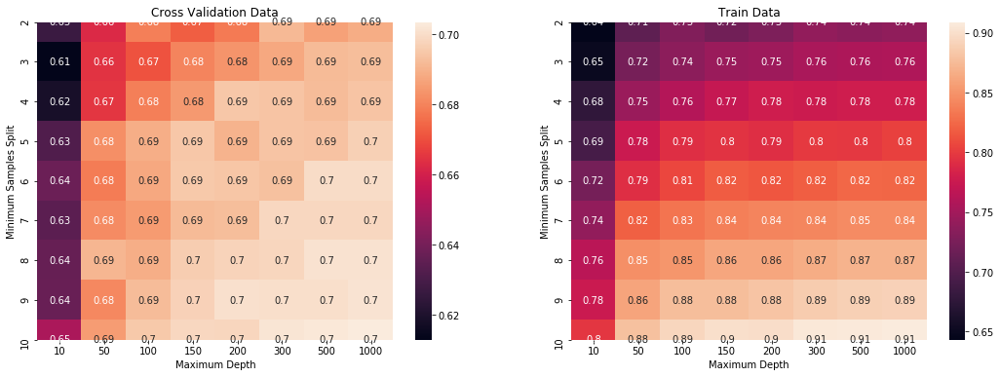

In [79]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_bow,annot = True,ax=axs[0])
sns.heatmap(trainscore_bow,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [80]:
mx_depth_bow = bowneigh.best_params_['max_depth']
n_estimator_bow = bowneigh.best_params_['n_estimators']

In [160]:
bowneigh.best_params_

{'max_depth': 10, 'n_estimators': 1000}

### Find AUC on test and train data

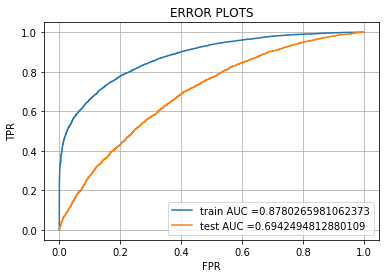

In [81]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


bowneigh_auc = RandomForestClassifier(class_weight='balanced',max_depth=mx_depth_bow,n_estimators=n_estimator_bow)
bowneigh_auc.fit(X_bow_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_bow_pred = bowneigh_auc.predict_proba(X_bow_tr)[:, 1]
y_test_bow_pred = bowneigh_auc.predict_proba(X_bow_te)[:, 1]

train_bow_fpr, train_bow_tpr, tr_bow_thresholds = roc_curve(y_train, y_train_bow_pred)
test_bow_fpr, test_bow_tpr, te_bow_thresholds = roc_curve(y_test, y_test_bow_pred)

plt.plot(train_bow_fpr, train_bow_tpr, label="train AUC ="+str(auc(train_bow_fpr, train_bow_tpr)))
plt.plot(test_bow_fpr, test_bow_tpr, label="test AUC ="+str(auc(test_bow_fpr, test_bow_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 10, 'n_estimators': 1000} is 87 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 10, 'n_estimators': 1000} is 69 %</p>


### find best threshold and plot confusion matrix

In [82]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_bowhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_bow(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_bow = find_best_bowhreshold(tr_bow_thresholds, train_bow_fpr, train_bow_tpr)

the maximum value of tpr*(1-fpr) 0.6226570187920154 for threshold 0.507


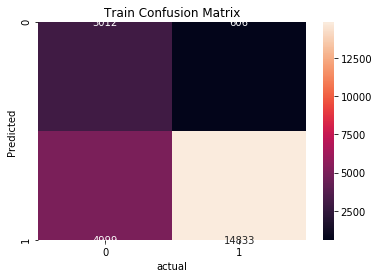

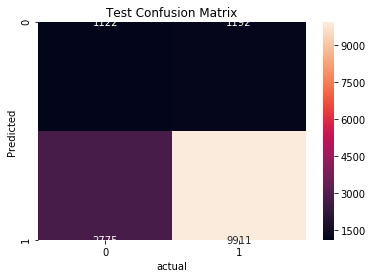

In [178]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_bow(y_train_bow_pred, best_bow))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.figsize=(18, 18)
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_bow(y_test_bow_pred, best_bow))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")

plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 10, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 10, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

### 2.4.1 Applying Random Forests on TFIDF ,<font color='red'> SET 2</font>

In [84]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tfidf_tr = hstack((X_train_essay_sentiment_neg.T,X_train_essay_sentiment_neu.T,X_train_essay_sentiment_pos.T,X_train_essay_sentiment_compound.T,X_train_number_of_words_project_title.T,X_train_number_of_words_essay.T,X_train_state_rc.T, X_train_teacher_rc.T, X_train_grade_rc.T, X_train_cleanc_rc.T, X_train_cleansub_rc.T , X_train_price_norm.T , X_train_teacherposted_norm.T,X_train_essay_tfidf,X_train_pt_tfidf)).tocsr()
X_tfidf_cr = hstack((X_cv_essay_sentiment_neg.T,X_cv_essay_sentiment_neu.T,X_cv_essay_sentiment_pos.T,X_cv_essay_sentiment_compound.T,X_cv_number_of_words_project_title.T,X_cv_number_of_words_essay.T,X_cv_state_rc.T, X_cv_teacher_rc.T, X_cv_grade_rc.T, X_cv_cleanc_rc.T, X_cv_cleansub_rc.T , X_cv_price_norm.T , X_cv_teacherposted_norm.T,X_cv_essay_tfidf,X_cv_pt_tfidf)).tocsr()
X_tfidf_te = hstack((X_test_essay_sentiment_neg.T,X_test_essay_sentiment_neu.T,X_test_essay_sentiment_pos.T,X_test_essay_sentiment_compound.T,X_test_number_of_words_project_title.T,X_test_number_of_words_essay.T,X_test_state_rc.T, X_test_teacher_rc.T, X_test_grade_rc.T, X_test_cleanc_rc.T, X_test_cleansub_rc.T , X_test_price_norm.T , X_test_teacherposted_norm.T,X_test_essay_tfidf,X_test_pt_tfidf)).tocsr()

print("Final Data matrix")
print(X_tfidf_tr.shape, y_train.shape)
print(X_tfidf_cr.shape, y_cv.shape)
print(X_tfidf_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 7061) (23450,)
(11550, 7061) (11550,)
(15000, 7061) (15000,)


### Applying RF on SET2

In [85]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
tfidfneigh = GridSearchCV(RandomForestClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True)
tfidfneigh.fit(X_tfidf_tr,y_train)
tfidfneigh.cv_results_

{'mean_fit_time': array([ 0.19736036,  0.47398527,  0.83334653,  1.1770823 ,  1.52084136,
         2.20830393,  3.64065695,  7.18232862,  0.21876637,  0.58854326,
         1.0625399 ,  1.52083103,  2.01562071,  2.94792581,  4.86981869,
         9.68755221,  0.23435752,  0.72395484,  1.33330242,  1.94794742,
         2.53645253,  3.7500066 ,  6.14060092, 12.25001168,  0.26566648,
         0.8541731 ,  1.60421689,  2.34895555,  3.09378417,  4.57291079,
         7.44269919, 14.84896239,  0.29689892,  1.00001097,  1.90103086,
         2.79168336,  3.71355772,  5.43231678,  8.9635338 , 17.86459049,
         0.32291333,  1.17186101,  2.2343924 ,  3.2551868 ,  4.35941037,
         6.47920736, 10.65626693, 21.30209494,  0.35940393,  1.35418105,
         2.58333397,  3.85420569,  5.06777604,  7.61460733, 12.54166436,
        24.98437365,  0.4167227 ,  1.58852704,  3.0260516 ,  4.46355208,
         5.93752265,  8.75000811, 14.5468839 , 29.15109173,  0.44271851,
         1.74480335,  3.41672659, 

In [86]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_tfidf=pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_tfidf

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.597693,0.667554,0.669825,0.674127,0.679493,0.687480,0.688300,0.692348
3,0.619926,0.663663,0.677143,0.681723,0.685840,0.689869,0.695317,0.694515
4,0.624667,0.674815,0.687358,0.691685,0.686802,0.690220,0.693680,0.695576
5,0.621170,0.675043,0.684056,0.686977,0.691463,0.694210,0.694865,0.695918
6,0.627213,0.674616,0.685948,0.691644,0.691733,0.697916,0.697625,0.699053
7,0.617014,0.677079,0.687554,0.692405,0.692723,0.699302,0.698308,0.699325
8,0.629768,0.678172,0.691695,0.691248,0.696839,0.696731,0.700019,0.701311
9,0.625869,0.677954,0.695033,0.695806,0.695703,0.699539,0.700432,0.704083
10,0.636970,0.691044,0.693234,0.697803,0.695140,0.702217,0.700720,0.704840


In [87]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_tfidf=pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_tfidf

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.632594,0.714836,0.723230,0.731957,0.740113,0.746957,0.746949,0.753006
3,0.663954,0.738387,0.755481,0.760085,0.759046,0.767158,0.770042,0.770572
4,0.692583,0.760060,0.781406,0.786437,0.783503,0.788898,0.791599,0.791725
5,0.703733,0.794646,0.795153,0.804672,0.813511,0.812004,0.811956,0.814791
6,0.732920,0.804808,0.824476,0.831646,0.830630,0.836679,0.839572,0.839786
7,0.753041,0.830555,0.843864,0.855376,0.853975,0.861225,0.861959,0.861661
8,0.775478,0.855215,0.870525,0.873877,0.879991,0.879847,0.881121,0.886662
9,0.799955,0.877876,0.893284,0.897881,0.898181,0.903969,0.903145,0.908265
10,0.809488,0.896875,0.915407,0.917950,0.916383,0.919901,0.922954,0.925998


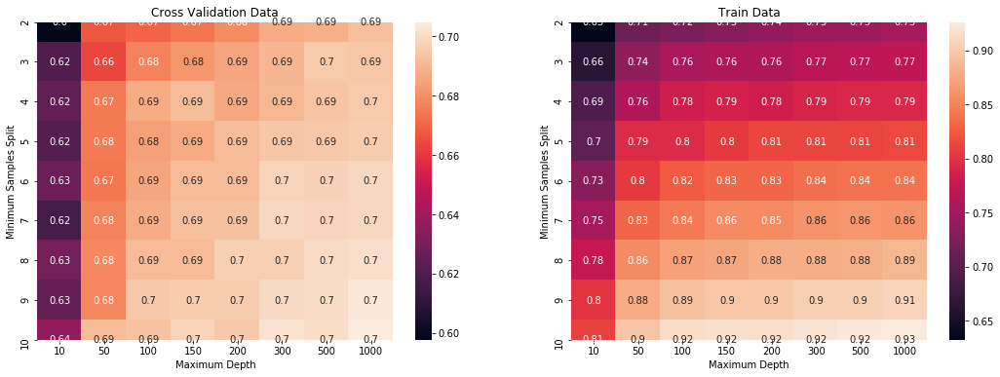

In [88]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_tfidf,annot = True,ax=axs[0])
sns.heatmap(trainscore_tfidf,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [89]:
mx_depth_tfidf = tfidfneigh.best_params_['max_depth']
n_estimator_tfidf = tfidfneigh.best_params_['n_estimators']
tfidfneigh.best_params_

{'max_depth': 10, 'n_estimators': 1000}

### Find AUC on test and train data

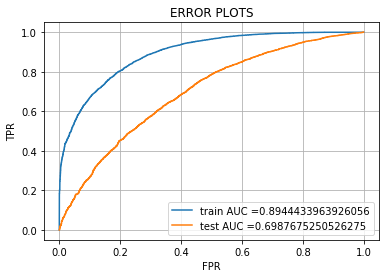

In [90]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


tfidfneigh_auc = RandomForestClassifier(class_weight='balanced',max_depth=mx_depth_tfidf,n_estimators=n_estimator_tfidf)
tfidfneigh_auc.fit(X_tfidf_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_tfidf_pred = tfidfneigh_auc.predict_proba(X_tfidf_tr)[:, 1]
y_test_tfidf_pred = tfidfneigh_auc.predict_proba(X_tfidf_te)[:, 1]

train_tfidf_fpr, train_tfidf_tpr, tr_tfidf_thresholds = roc_curve(y_train, y_train_tfidf_pred)
test_tfidf_fpr, test_tfidf_tpr, te_tfidf_thresholds = roc_curve(y_test, y_test_tfidf_pred)

plt.plot(train_tfidf_fpr, train_tfidf_tpr, label="train AUC ="+str(auc(train_tfidf_fpr, train_tfidf_tpr)))
plt.plot(test_tfidf_fpr, test_tfidf_tpr, label="test AUC ="+str(auc(test_tfidf_fpr, test_tfidf_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 10, 'n_estimators': 1000} is 89 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 10, 'n_estimators': 1000} is 69 %</p>


### find best threshold and plot confusion matrix

In [91]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_tfidfhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_tfidf(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_tfidf = find_best_tfidfhreshold(tr_tfidf_thresholds, train_tfidf_fpr, train_tfidf_tpr)

the maximum value of tpr*(1-fpr) 0.6457270926529113 for threshold 0.508


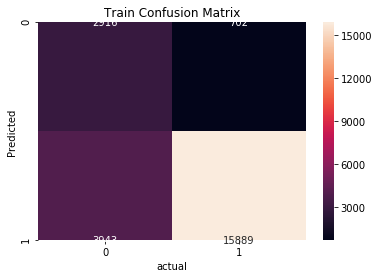

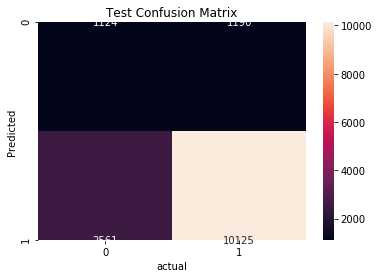

In [92]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_tfidf(y_train_tfidf_pred, best_tfidf))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_tfidf(y_test_tfidf_pred, best_tfidf))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 10, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 10, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

In [93]:
#Convert to numpy arrays
X_train_avg_w2v_essay1=np.array(X_train_avg_w2v_essay)
X_cv_avg_w2v_essay1=np.array(X_cv_avg_w2v_essay)
X_test_avg_w2v_essay1=np.array(X_test_avg_w2v_essay)
X_train_avg_w2v_title1=np.array(X_train_avg_w2v_title)
X_cv_avg_w2v_title1=np.array(X_cv_avg_w2v_title)
X_test_avg_w2v_title1=np.array(X_test_avg_w2v_title)
X_train_avg_w2v_title1.shape

(23450, 300)

### 2.4.3 Applying Random Forests on AVG W2V,<font color='red'> SET 3</font>

In [96]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039


from scipy import sparse

# convert array to sparse matrix https://stackoverflow.com/questions/7922487/how-to-transform-numpy-matrix-or-array-to-scipy-sparse-matrix
from scipy.sparse import hstack
from scipy.sparse import csr_matrix
X_avgw2v_tr = hstack((sparse.csr_matrix(X_train_essay_sentiment_neg.T),sparse.csr_matrix(X_train_essay_sentiment_neu.T),sparse.csr_matrix(X_train_essay_sentiment_pos.T),sparse.csr_matrix(X_train_essay_sentiment_compound.T),sparse.csr_matrix(X_train_number_of_words_project_title.T),sparse.csr_matrix(X_train_number_of_words_essay.T),sparse.csr_matrix(X_train_state_rc.T),sparse.csr_matrix( X_train_teacher_rc.T),sparse.csr_matrix( X_train_grade_rc.T),sparse.csr_matrix( X_train_cleanc_rc.T),sparse.csr_matrix( X_train_cleansub_rc.T ),sparse.csr_matrix( X_train_price_norm.T ),sparse.csr_matrix( X_train_teacherposted_norm.T),X_train_avg_w2v_essay1,X_train_avg_w2v_title1)).tocsr()
X_avgw2v_cr = hstack((sparse.csr_matrix(X_cv_essay_sentiment_neg.T),sparse.csr_matrix(X_cv_essay_sentiment_neu.T),sparse.csr_matrix(X_cv_essay_sentiment_pos.T),sparse.csr_matrix(X_cv_essay_sentiment_compound.T),sparse.csr_matrix(X_cv_number_of_words_project_title.T),sparse.csr_matrix(X_cv_number_of_words_essay.T),sparse.csr_matrix(X_cv_state_rc.T),sparse.csr_matrix( X_cv_teacher_rc.T),sparse.csr_matrix( X_cv_grade_rc.T),sparse.csr_matrix( X_cv_cleanc_rc.T),sparse.csr_matrix( X_cv_cleansub_rc.T ),sparse.csr_matrix( X_cv_price_norm.T ),sparse.csr_matrix( X_cv_teacherposted_norm.T),X_cv_avg_w2v_essay1,X_cv_avg_w2v_title1)).tocsr()
X_avgw2v_te = hstack((sparse.csr_matrix(X_test_essay_sentiment_neg.T),sparse.csr_matrix(X_test_essay_sentiment_neu.T),sparse.csr_matrix(X_test_essay_sentiment_pos.T),sparse.csr_matrix(X_test_essay_sentiment_compound.T),sparse.csr_matrix(X_test_number_of_words_project_title.T),sparse.csr_matrix(X_test_number_of_words_essay.T),sparse.csr_matrix(X_test_state_rc.T),sparse.csr_matrix( X_test_teacher_rc.T),sparse.csr_matrix( X_test_grade_rc.T),sparse.csr_matrix( X_test_cleanc_rc.T),sparse.csr_matrix( X_test_cleansub_rc.T ),sparse.csr_matrix( X_test_price_norm.T ),sparse.csr_matrix( X_test_teacherposted_norm.T),X_test_avg_w2v_essay1,X_test_avg_w2v_title1)).tocsr()

print("Final Data matrix")
print(X_avgw2v_tr.shape, y_train.shape)
print(X_avgw2v_cr.shape, y_cv.shape)
print(X_avgw2v_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 618) (23450,)
(11550, 618) (11550,)
(15000, 618) (15000,)


In [98]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
avgw2vneigh = GridSearchCV(RandomForestClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
avgw2vneigh.fit(X_avgw2v_tr,y_train)
avgw2vneigh.cv_results_

{'mean_fit_time': array([  1.9583389 ,   6.18230311,  11.28427116,  16.53165674,
         21.88022264,  32.69538442,  54.05725733, 106.29151662,
          2.26562683,   8.65623816,  16.66658823,  24.6822025 ,
         33.22398869,  50.39585686,  81.64579328, 160.57813565,
          2.85938811,  11.93750842,  22.97394999,  34.21356193,
         45.04529452,  68.13382951, 112.22396994, 225.10417263,
          3.61978626,  15.47703942,  30.35938549,  45.17381581,
         60.25001017,  90.82292446, 149.79164918, 297.14584788,
          4.50001423,  19.86906735,  39.76561006,  59.11457578,
         77.66666857, 117.01044861, 195.7292064 , 387.974015  ,
          5.44270356,  24.97917223,  49.86979795,  75.05727776,
        100.13543908, 148.55729453, 247.50041755, 493.83590309,
          6.76044369,  31.12551435,  62.0676949 ,  93.69792088,
        122.52603738, 183.10414251, 304.95830003, 611.74861058,
          8.09376383,  37.25520849,  74.50528566, 110.80196619,
        147.09900276, 2

In [99]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_avgw2v=pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_avgw2v

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.633477,0.672964,0.673438,0.677855,0.680138,0.677574,0.681362,0.681912
3,0.649682,0.681065,0.682485,0.683537,0.685854,0.687089,0.686893,0.686715
4,0.646862,0.683423,0.685025,0.689291,0.689481,0.690377,0.690449,0.691264
5,0.649598,0.686782,0.691560,0.691043,0.694064,0.692873,0.693907,0.696319
6,0.642516,0.685084,0.690057,0.693123,0.694465,0.696352,0.695441,0.696646
7,0.641253,0.683549,0.688659,0.691152,0.694912,0.696107,0.695456,0.698022
8,0.632940,0.677667,0.690295,0.693464,0.691099,0.694259,0.696383,0.698399
9,0.621087,0.676349,0.685494,0.688628,0.691463,0.694328,0.692900,0.696309
10,0.629402,0.670382,0.682011,0.691013,0.691044,0.690515,0.694039,0.696409


In [100]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_avgw2v=pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_avgw2v

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.664080,0.708388,0.709308,0.715359,0.715744,0.718129,0.718343,0.720185
3,0.698675,0.738296,0.739082,0.740885,0.744833,0.745523,0.744661,0.744906
4,0.728721,0.771050,0.775938,0.779328,0.780548,0.781802,0.782811,0.782487
5,0.766795,0.821004,0.827801,0.829533,0.828794,0.829900,0.832137,0.834157
6,0.811200,0.871697,0.881309,0.886308,0.886317,0.887870,0.890156,0.890546
7,0.859165,0.927342,0.934525,0.937355,0.941364,0.941158,0.941637,0.943046
8,0.903318,0.964972,0.972067,0.975697,0.976344,0.976879,0.978127,0.978574
9,0.942129,0.986309,0.991337,0.992002,0.993079,0.993809,0.993923,0.994744
10,0.963474,0.995779,0.997883,0.998105,0.998552,0.998867,0.998970,0.999060


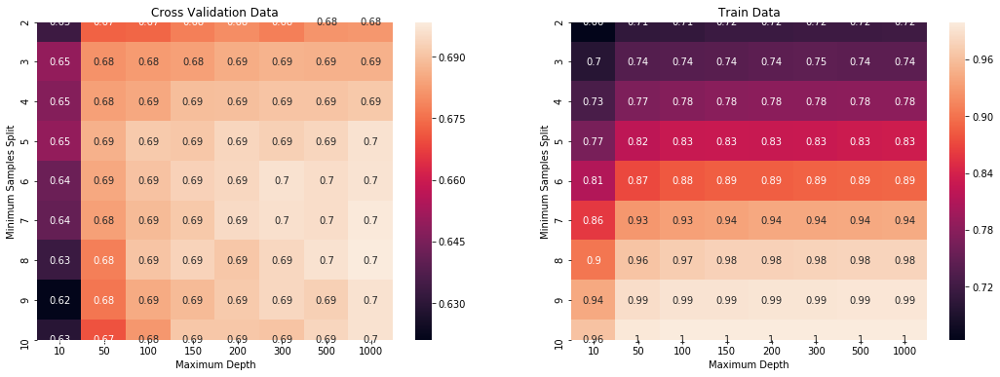

In [101]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_avgw2v,annot = True,ax=axs[0])
sns.heatmap(trainscore_avgw2v,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [102]:
avgw2vneigh.best_params_
mx_depth_avgw2v = avgw2vneigh.best_params_['max_depth']
n_estimator_avgw2v = avgw2vneigh.best_params_['n_estimators']

In [103]:
avgw2vneigh.best_params_

{'max_depth': 8, 'n_estimators': 1000}

### Find AUC on test and train data

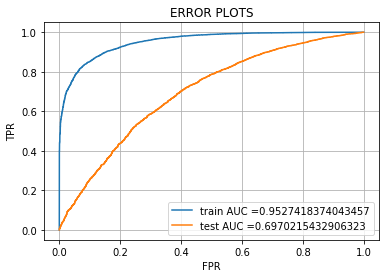

In [105]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


avgw2vneigh_auc = RandomForestClassifier(class_weight='balanced',max_depth=mx_depth_avgw2v,n_estimators=n_estimator_avgw2v,n_jobs=-1)
avgw2vneigh_auc.fit(X_avgw2v_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_avgw2v_pred = avgw2vneigh_auc.predict_proba(X_avgw2v_tr)[:, 1]
y_test_avgw2v_pred = avgw2vneigh_auc.predict_proba(X_avgw2v_te)[:, 1]

train_avgw2v_fpr, train_avgw2v_tpr, tr_avgw2v_thresholds = roc_curve(y_train, y_train_avgw2v_pred)
test_avgw2v_fpr, test_avgw2v_tpr, te_avgw2v_thresholds = roc_curve(y_test, y_test_avgw2v_pred)

plt.plot(train_avgw2v_fpr, train_avgw2v_tpr, label="train AUC ="+str(auc(train_avgw2v_fpr, train_avgw2v_tpr)))
plt.plot(test_avgw2v_fpr, test_avgw2v_tpr, label="test AUC ="+str(auc(test_avgw2v_fpr, test_avgw2v_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 8, 'n_estimators': 1000} is 95 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 8, 'n_estimators': 1000} is 69 %</p>


### find best threshold and plot confusion matrix

In [106]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_avgw2vhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_avgw2v(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_avgw2v = find_best_avgw2vhreshold(tr_avgw2v_thresholds, train_avgw2v_fpr, train_avgw2v_tpr)

the maximum value of tpr*(1-fpr) 0.7689577525843955 for threshold 0.527


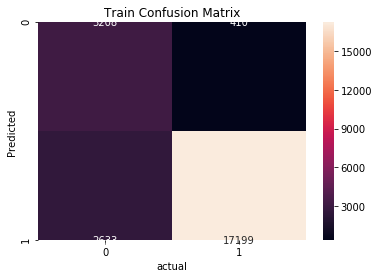

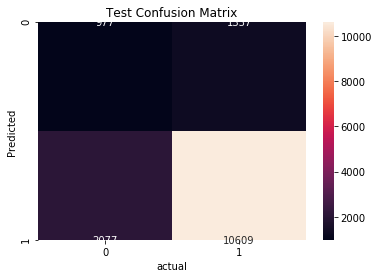

In [107]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_avgw2v(y_train_avgw2v_pred, best_avgw2v))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_avgw2v(y_test_avgw2v_pred, best_avgw2v))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 8, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 8, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

In [ ]:
# Please write all the code with proper documentation

### 2.4.4 Applying Random Forests on TFIDF W2V,<font color='red'> SET 4</font>

### Concatinating all the features for SET 2

In [108]:
#Convert to numpy arrays
X_train_tfidf_w2v_essay1=np.array(X_train_tfidf_w2v_essay)
X_cv_tfidf_w2v_essay1=np.array(X_cv_tfidf_w2v_essay)
X_test_tfidf_w2v_essay1=np.array(X_test_tfidf_w2v_essay)
X_train_tfidf_w2v_title1=np.array(X_train_tfidf_w2v_title)
X_cv_tfidf_w2v_title1=np.array(X_cv_tfidf_w2v_title)
X_test_tfidf_w2v_title1=np.array(X_test_tfidf_w2v_title)
X_train_tfidf_w2v_title1.shape

(23450, 300)

In [109]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

# convert array to sparse matrix https://stackoverflow.com/questions/7922487/how-to-transform-numpy-matrix-or-array-to-scipy-sparse-matrix
from scipy.sparse import hstack
X_tfidfw2v_tr = hstack((sparse.csr_matrix(X_train_essay_sentiment_neg.T),sparse.csr_matrix(X_train_essay_sentiment_neu.T),sparse.csr_matrix(X_train_essay_sentiment_pos.T),sparse.csr_matrix(X_train_essay_sentiment_compound.T),sparse.csr_matrix(X_train_number_of_words_project_title.T),sparse.csr_matrix(X_train_number_of_words_essay.T),sparse.csr_matrix(X_train_state_rc.T),sparse.csr_matrix( X_train_teacher_rc.T),sparse.csr_matrix( X_train_grade_rc.T),sparse.csr_matrix( X_train_cleanc_rc.T),sparse.csr_matrix( X_train_cleansub_rc.T ),sparse.csr_matrix( X_train_price_norm.T ),sparse.csr_matrix( X_train_teacherposted_norm.T),X_train_tfidf_w2v_essay1,X_train_tfidf_w2v_title1)).tocsr()
X_tfidfw2v_cr = hstack((sparse.csr_matrix(X_cv_essay_sentiment_neg.T),sparse.csr_matrix(X_cv_essay_sentiment_neu.T),sparse.csr_matrix(X_cv_essay_sentiment_pos.T),sparse.csr_matrix(X_cv_essay_sentiment_compound.T),sparse.csr_matrix(X_cv_number_of_words_project_title.T),sparse.csr_matrix(X_cv_number_of_words_essay.T),sparse.csr_matrix(X_cv_state_rc.T),sparse.csr_matrix( X_cv_teacher_rc.T),sparse.csr_matrix( X_cv_grade_rc.T),sparse.csr_matrix( X_cv_cleanc_rc.T),sparse.csr_matrix( X_cv_cleansub_rc.T ),sparse.csr_matrix( X_cv_price_norm.T ),sparse.csr_matrix( X_cv_teacherposted_norm.T),X_cv_tfidf_w2v_essay1,X_cv_tfidf_w2v_title1)).tocsr()
X_tfidfw2v_te = hstack((sparse.csr_matrix(X_test_essay_sentiment_neg.T),sparse.csr_matrix(X_test_essay_sentiment_neu.T),sparse.csr_matrix(X_test_essay_sentiment_pos.T),sparse.csr_matrix(X_test_essay_sentiment_compound.T),sparse.csr_matrix(X_test_number_of_words_project_title.T),sparse.csr_matrix(X_test_number_of_words_essay.T),sparse.csr_matrix(X_test_state_rc.T),sparse.csr_matrix( X_test_teacher_rc.T),sparse.csr_matrix( X_test_grade_rc.T),sparse.csr_matrix( X_test_cleanc_rc.T),sparse.csr_matrix( X_test_cleansub_rc.T ),sparse.csr_matrix( X_test_price_norm.T ),sparse.csr_matrix( X_test_teacherposted_norm.T),X_test_tfidf_w2v_essay1,X_test_tfidf_w2v_title1)).tocsr()

print("Final Data matrix")
print(X_tfidfw2v_tr.shape, y_train.shape)
print(X_tfidfw2v_cr.shape, y_cv.shape)
print(X_tfidfw2v_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 618) (23450,)
(11550, 618) (11550,)
(15000, 618) (15000,)


### Applying DT on SET2

In [110]:
parametersK1 = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
tfidfw2vneigh = GridSearchCV(RandomForestClassifier(class_weight='balanced'), parametersK1, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
tfidfw2vneigh.fit(X_tfidfw2v_tr,y_train)
tfidfw2vneigh.cv_results_

{'mean_fit_time': array([  1.92188573,   6.07810704,  11.13542   ,  16.69223301,
         22.05210821,  32.22219451,  54.75162578, 107.24432794,
          2.55407763,   8.59612258,  16.59324837,  24.48143673,
         33.23340432,  48.95092209,  84.44168584, 160.90231943,
          2.90187621,  11.86883767,  23.17088604,  35.32379134,
         45.49650939,  70.20889934, 113.55251312, 223.98548547,
          3.81661463,  17.04702743,  32.76349187,  48.1876963 ,
         61.29864399,  89.74687163, 150.02599748, 295.31773464,
          4.58318528,  19.85931087,  39.13533886,  58.2760609 ,
         77.71354699, 116.21878791, 193.9218661 , 384.62210894,
          5.6145649 ,  25.60416985,  49.42707197,  74.33331831,
         98.31696216, 146.01042978, 244.02085487, 490.36455671,
          7.14583182,  30.65095894,  60.75524569,  91.47902258,
        121.94789624, 181.80732258, 304.07624531, 606.28216012,
          7.86978205,  37.11459152,  74.5052553 , 110.54165006,
        146.302085  , 2

In [112]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_w2v=pd.pivot_table(pd.DataFrame(tfidfw2vneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_w2v

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.632399,0.670451,0.672285,0.673658,0.676655,0.674303,0.676770,0.676750
3,0.643025,0.670348,0.680466,0.680938,0.680824,0.682310,0.682938,0.684263
4,0.649115,0.677308,0.685975,0.684342,0.688622,0.688339,0.688265,0.689770
5,0.658577,0.681457,0.686948,0.688026,0.690771,0.691580,0.691726,0.691463
6,0.645452,0.684021,0.688393,0.687825,0.690281,0.691304,0.692614,0.692989
7,0.652244,0.680416,0.688368,0.690193,0.691904,0.691417,0.691812,0.693270
8,0.648511,0.678369,0.686071,0.689427,0.689147,0.690667,0.690615,0.691855
9,0.632700,0.675853,0.684985,0.687960,0.689574,0.690471,0.691030,0.691576
10,0.641670,0.674792,0.685003,0.684939,0.686558,0.687321,0.690524,0.690900


In [113]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_w2v=pd.pivot_table(pd.DataFrame(tfidfw2vneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_w2v

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.663983,0.701056,0.706824,0.709687,0.713012,0.710376,0.712209,0.712843
3,0.696649,0.723577,0.737607,0.735807,0.734622,0.735332,0.737331,0.739128
4,0.720965,0.759134,0.767956,0.768052,0.772770,0.770803,0.772190,0.773508
5,0.763017,0.802405,0.812288,0.815860,0.815209,0.816657,0.818973,0.817911
6,0.808476,0.855270,0.864568,0.866396,0.868666,0.870836,0.871529,0.872707
7,0.854984,0.912679,0.916872,0.922006,0.921356,0.923125,0.923846,0.925180
8,0.900485,0.950023,0.959083,0.961057,0.961655,0.964184,0.965986,0.965870
9,0.932284,0.978801,0.983495,0.985939,0.985922,0.987063,0.988153,0.988658
10,0.956599,0.992033,0.995123,0.995720,0.996275,0.996657,0.996894,0.997039


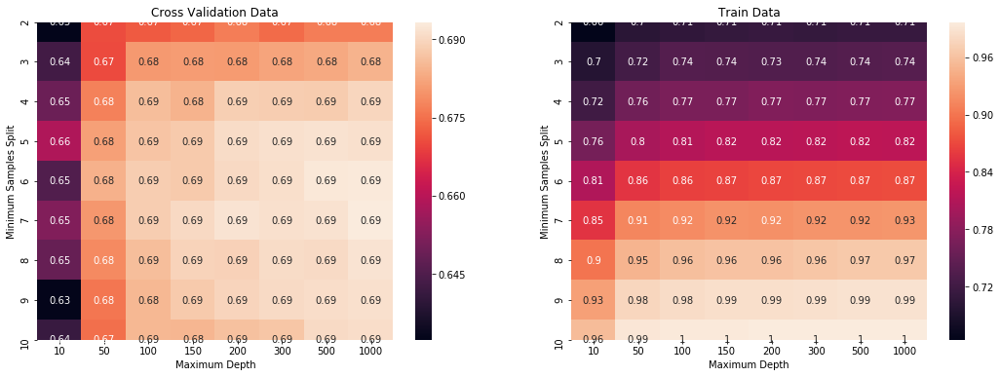

In [114]:
# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_w2v,annot = True,ax=axs[0])
sns.heatmap(trainscore_w2v,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [115]:
mx_depth_tfidfw2v = tfidfw2vneigh.best_params_['max_depth']
n_estimator_tfidfw2v = tfidfw2vneigh.best_params_['n_estimators']
tfidfw2vneigh.best_params_

{'max_depth': 7, 'n_estimators': 1000}

### Find AUC on test and train data

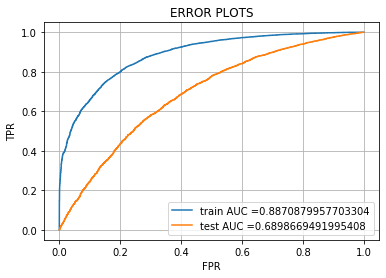

In [116]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


tfidfw2vneigh_auc = RandomForestClassifier(class_weight='balanced',max_depth=mx_depth_tfidfw2v,n_estimators=n_estimator_tfidfw2v,n_jobs=-1)
tfidfw2vneigh_auc.fit(X_tfidfw2v_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_tfidfw2v_pred = tfidfw2vneigh_auc.predict_proba(X_tfidfw2v_tr)[:, 1]
y_test_tfidfw2v_pred = tfidfw2vneigh_auc.predict_proba(X_tfidfw2v_te)[:, 1]

train_tfidfw2v_fpr, train_tfidfw2v_tpr, tr_tfidfw2v_thresholds = roc_curve(y_train, y_train_tfidfw2v_pred)
test_tfidfw2v_fpr, test_tfidfw2v_tpr, te_tfidfw2v_thresholds = roc_curve(y_test, y_test_tfidfw2v_pred)

plt.plot(train_tfidfw2v_fpr, train_tfidfw2v_tpr, label="train AUC ="+str(auc(train_tfidfw2v_fpr, train_tfidfw2v_tpr)))
plt.plot(test_tfidfw2v_fpr, test_tfidfw2v_tpr, label="test AUC ="+str(auc(test_tfidfw2v_fpr, test_tfidfw2v_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 7, 'n_estimators': 1000} is 88 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 7, 'n_estimators': 1000} is 68 %</p>


### find best threshold and plot confusion matrix

In [117]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_tfidfw2vhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_tfidfw2v(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_tfidfw2v = find_best_tfidfw2vhreshold(tr_tfidfw2v_thresholds, train_tfidfw2v_fpr, train_tfidfw2v_tpr)

the maximum value of tpr*(1-fpr) 0.6427322845233293 for threshold 0.504


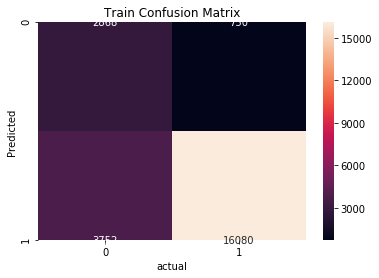

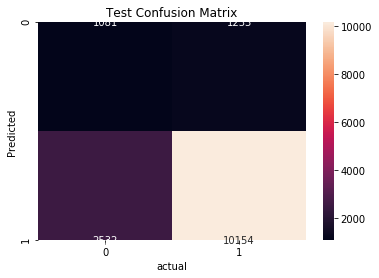

In [118]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_tfidfw2v(y_train_tfidfw2v_pred, best_tfidfw2v))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_tfidfw2v(y_test_tfidfw2v_pred, best_tfidfw2v))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 7, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 7, 'n_estimators': 1000} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

In [119]:
# Please write all the code with proper documentation

<h2>2.5 Applying GBDT</h2>

<br>Apply GBDT on different kind of featurization as mentioned in the instructions
<br> For Every model that you work on make sure you do the step 2 and step 3 of instrucations

### 2.5.1 Applying XGBOOST on BOW,<font color='red'> SET 1</font>

In [120]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack

X_bow_GB_tr = hstack((X_train_essay_sentiment_neg.T,X_train_essay_sentiment_neu.T,X_train_essay_sentiment_pos.T,X_train_essay_sentiment_compound.T,X_train_number_of_words_project_title.T,X_train_number_of_words_essay.T,X_train_state_rc.T, X_train_teacher_rc.T, X_train_grade_rc.T, X_train_cleanc_rc.T, X_train_cleansub_rc.T , X_train_price_norm.T , X_train_teacherposted_norm.T,X_train_essay_bow,X_train_pt_bow)).tocsr()
X_bow_GB_cr = hstack((X_cv_essay_sentiment_neg.T,X_cv_essay_sentiment_neu.T,X_cv_essay_sentiment_pos.T,X_cv_essay_sentiment_compound.T,X_cv_number_of_words_project_title.T,X_cv_number_of_words_essay.T,X_cv_state_rc.T, X_cv_teacher_rc.T, X_cv_grade_rc.T, X_cv_cleanc_rc.T, X_cv_cleansub_rc.T , X_cv_price_norm.T , X_cv_teacherposted_norm.T,X_cv_essay_bow,X_cv_pt_bow)).tocsr()
X_bow_GB_te = hstack((X_test_essay_sentiment_neg.T,X_test_essay_sentiment_neu.T,X_test_essay_sentiment_pos.T,X_test_essay_sentiment_compound.T,X_test_number_of_words_project_title.T,X_test_number_of_words_essay.T,X_test_state_rc.T, X_test_teacher_rc.T, X_test_grade_rc.T, X_test_cleanc_rc.T, X_test_cleansub_rc.T , X_test_price_norm.T , X_test_teacherposted_norm.T,X_test_essay_bow,X_test_pt_bow)).tocsr()

print("Final Data matrix")
print(X_bow_GB_tr.shape, y_train.shape)
print(X_bow_GB_cr.shape, y_cv.shape)
print(X_bow_GB_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 7061) (23450,)
(11550, 7061) (11550,)
(15000, 7061) (15000,)


In [121]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
bow_GBneigh = GridSearchCV(XGBClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
bow_GBneigh.fit(X_bow_GB_tr,y_train)
bow_GBneigh.cv_results_

{'mean_fit_time': array([  3.68746972,  11.54652286,  21.46113507,  31.47062278,
         41.13543908,  61.37917876, 100.0677344 , 197.604177  ,
          4.2969993 ,  15.19792883,  28.77082189,  42.23958206,
         56.16665792,  82.92709287, 136.83853873, 270.82291071,
          5.05203962,  19.04165936,  36.30729167,  53.46352975,
         70.72917183, 105.06775395, 174.3958296 , 346.79682374,
          5.89067634,  23.45311673,  43.99996217,  64.96345131,
         86.03644911, 127.89584843, 212.21589756, 421.01567888,
          6.71876438,  27.03381991,  51.87500246,  76.67709152,
        101.35938565, 150.82293733, 249.72104859, 497.03654766,
          7.58852204,  31.33332475,  60.04168057,  88.80210908,
        116.93750779, 174.81250699, 290.31257161, 573.61990571,
          8.6979154 ,  35.5781273 ,  68.13332836, 100.25001828,
        133.27109241, 197.29683733, 327.437555  , 650.32296642,
          9.48435855,  39.97541936,  76.50521843, 112.78123609,
        149.59376558, 2

In [122]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_bow_GB=pd.pivot_table(pd.DataFrame(bow_GBneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_bow_GB

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.637311,0.691344,0.708326,0.714668,0.718490,0.722225,0.724514,0.724200
3,0.642913,0.698690,0.712514,0.717698,0.720369,0.721007,0.722005,0.718482
4,0.649681,0.703880,0.714272,0.716935,0.718639,0.719133,0.717509,0.713286
5,0.654317,0.705742,0.715666,0.717261,0.717598,0.717324,0.715532,0.712681
6,0.655274,0.703712,0.713320,0.715337,0.715551,0.714845,0.714288,0.711804
7,0.652439,0.704276,0.713120,0.714741,0.714605,0.713135,0.710685,0.709441
8,0.654122,0.706894,0.714434,0.716417,0.715345,0.714778,0.711656,0.710185
9,0.646331,0.704578,0.711578,0.710650,0.711797,0.711154,0.709959,0.708995
10,0.646301,0.704681,0.710407,0.711962,0.711701,0.711041,0.709811,0.708748


In [123]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_bow_GB=pd.pivot_table(pd.DataFrame(bow_GBneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_bow_GB

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.661885,0.726046,0.756843,0.777737,0.795376,0.823752,0.863381,0.921682
3,0.685228,0.764540,0.808575,0.838476,0.861579,0.895220,0.938078,0.983289
4,0.713990,0.810288,0.863697,0.895475,0.918553,0.949350,0.980035,0.998240
5,0.748886,0.861241,0.912715,0.940103,0.957825,0.979957,0.995463,0.999929
6,0.791432,0.906490,0.950121,0.970099,0.982088,0.993470,0.999224,0.999999
7,0.828863,0.942604,0.974279,0.987300,0.993609,0.998460,0.999933,1.000000
8,0.865340,0.969475,0.988852,0.995643,0.998325,0.999793,0.999998,1.000000
9,0.896459,0.984422,0.995783,0.998618,0.999616,0.999966,1.000000,1.000000
10,0.924093,0.992630,0.998432,0.999705,0.999943,0.999999,1.000000,1.000000


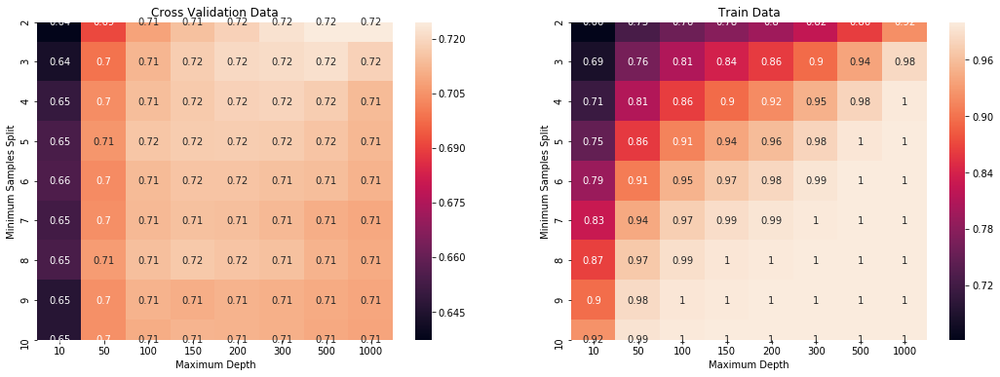

In [124]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(bowneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_bow_GB,annot = True,ax=axs[0])
sns.heatmap(trainscore_bow_GB,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [125]:
mx_depth_bow_GB = bow_GBneigh.best_params_['max_depth']
n_estimator_bow_GB = bow_GBneigh.best_params_['n_estimators']
bow_GBneigh.best_params_

{'max_depth': 2, 'n_estimators': 500}

### Find AUC on test and train data

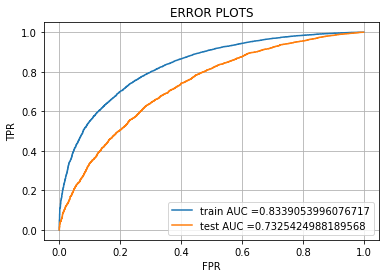

In [126]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


bow_GBneigh_auc = XGBClassifier(class_weight='balanced', max_depth = mx_depth_bow_GB, n_estimators = n_estimator_bow_GB,n_jobs=-1)
bow_GBneigh_auc.fit(X_bow_GB_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_bow_GB_pred = bow_GBneigh_auc.predict_proba(X_bow_GB_tr)[:, 1]
y_test_bow_GB_pred = bow_GBneigh_auc.predict_proba(X_bow_GB_te)[:, 1]

train_bow_GB_fpr, train_bow_GB_tpr, tr_bow_GB_thresholds = roc_curve(y_train, y_train_bow_GB_pred)
test_bow_GB_fpr, test_bow_GB_tpr, te_bow_GB_thresholds = roc_curve(y_test, y_test_bow_GB_pred)

plt.plot(train_bow_GB_fpr, train_bow_GB_tpr, label="train AUC ="+str(auc(train_bow_GB_fpr, train_bow_GB_tpr)))
plt.plot(test_bow_GB_fpr, test_bow_GB_tpr, label="test AUC ="+str(auc(test_bow_GB_fpr, test_bow_GB_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 500} is 83 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 500} is 73 %</p>


### find best threshold and plot confusion matrix

In [127]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_bow_GBhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_bow_GB(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_bow_GB = find_best_bow_GBhreshold(tr_bow_GB_thresholds, train_bow_GB_fpr, train_bow_GB_tpr)

the maximum value of tpr*(1-fpr) 0.5682068791892807 for threshold 0.823


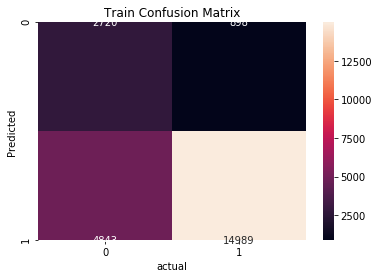

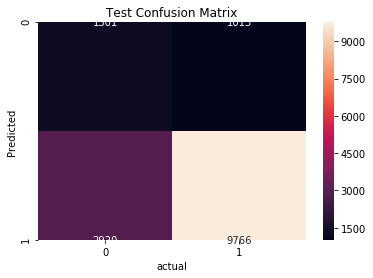

In [128]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_bow_GB(y_train_bow_GB_pred, best_bow_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_bow_GB(y_test_bow_GB_pred, best_bow_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 500} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 500} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

### 2.5.2 Applying XGBOOST on TFIDF,<font color='red'> SET 2</font>

In [129]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
from scipy.sparse import hstack
X_tfidf_GB_tr = hstack((X_train_essay_sentiment_neg.T,X_train_essay_sentiment_neu.T,X_train_essay_sentiment_pos.T,X_train_essay_sentiment_compound.T,X_train_number_of_words_project_title.T,X_train_number_of_words_essay.T,X_train_state_rc.T, X_train_teacher_rc.T, X_train_grade_rc.T, X_train_cleanc_rc.T, X_train_cleansub_rc.T , X_train_price_norm.T , X_train_teacherposted_norm.T,X_train_essay_tfidf,X_train_pt_tfidf)).tocsr()
X_tfidf_GB_cr = hstack((X_cv_essay_sentiment_neg.T,X_cv_essay_sentiment_neu.T,X_cv_essay_sentiment_pos.T,X_cv_essay_sentiment_compound.T,X_cv_number_of_words_project_title.T,X_cv_number_of_words_essay.T,X_cv_state_rc.T, X_cv_teacher_rc.T, X_cv_grade_rc.T, X_cv_cleanc_rc.T, X_cv_cleansub_rc.T , X_cv_price_norm.T , X_cv_teacherposted_norm.T,X_cv_essay_tfidf,X_cv_pt_tfidf)).tocsr()
X_tfidf_GB_te = hstack((X_test_essay_sentiment_neg.T,X_test_essay_sentiment_neu.T,X_test_essay_sentiment_pos.T,X_test_essay_sentiment_compound.T,X_test_number_of_words_project_title.T,X_test_number_of_words_essay.T,X_test_state_rc.T, X_test_teacher_rc.T, X_test_grade_rc.T, X_test_cleanc_rc.T, X_test_cleansub_rc.T , X_test_price_norm.T , X_test_teacherposted_norm.T,X_test_essay_tfidf,X_test_pt_tfidf)).tocsr()

print("Final Data matrix")
print(X_tfidf_GB_tr.shape, y_train.shape)
print(X_tfidf_GB_cr.shape, y_cv.shape)
print(X_tfidf_GB_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 7061) (23450,)
(11550, 7061) (11550,)
(15000, 7061) (15000,)


In [130]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
tfidf_GBneigh = GridSearchCV(XGBClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
tfidf_GBneigh.fit(X_tfidf_GB_tr,y_train)
tfidf_GBneigh.cv_results_

{'mean_fit_time': array([   6.30738958,   24.47908092,   48.27611224,   69.45030586,
          91.21876033,  137.36454598,  224.5936923 ,  452.22914179,
           8.22394657,   34.78646541,   66.89062929,   98.54690131,
         131.00515366,  194.63017964,  323.46881048,  642.43752686,
          10.56767472,   45.18229675,   89.14584271,  129.09383774,
         172.7603426 ,  253.95317022,  424.09893497,  839.35425957,
          12.28644522,   55.28125866,  109.03644745,  158.82291134,
         213.42191418,  318.4792947 ,  518.35946242, 1034.04680014,
          14.18229874,   67.02604588,  128.56771636,  189.78639905,
         249.61617184,  375.20987225,  615.55723627, 1236.32815735,
          16.33854206,   75.00003235,  146.38018886,  217.99469169,
         288.65103563,  430.18232592,  711.12564794, 1412.74492041,
          18.75521747,   85.88543137,  173.64581625,  249.26566744,
         328.48788261,  497.64065989,  810.35421975, 1581.28651158,
          20.30729707,   95.380

In [131]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_tfidf_GB=pd.pivot_table(pd.DataFrame(tfidf_GBneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_tfidf_GB

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.637217,0.691544,0.705770,0.710758,0.713876,0.716893,0.719726,0.718675
3,0.645287,0.697863,0.710812,0.714550,0.716057,0.718802,0.717403,0.712712
4,0.655061,0.703323,0.714962,0.717404,0.719491,0.718816,0.716237,0.710890
5,0.651940,0.703601,0.712786,0.713081,0.713514,0.713315,0.711114,0.706145
6,0.653603,0.705276,0.712219,0.712698,0.713830,0.713692,0.711863,0.707165
7,0.656441,0.703917,0.710796,0.712709,0.711727,0.710730,0.708443,0.704371
8,0.651766,0.704652,0.711224,0.712409,0.712630,0.711720,0.708919,0.706089
9,0.647084,0.702651,0.709135,0.709215,0.709908,0.710249,0.707980,0.706452
10,0.644775,0.704409,0.709416,0.710049,0.710357,0.708633,0.707323,0.706109


In [132]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_tfidf_GB=pd.pivot_table(pd.DataFrame(tfidf_GBneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_tfidf_GB

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.664740,0.733597,0.771928,0.797556,0.819355,0.852708,0.898769,0.957193
3,0.689421,0.779630,0.832375,0.865702,0.890714,0.925519,0.964559,0.995022
4,0.723415,0.834764,0.889939,0.921831,0.943400,0.969676,0.991304,0.999743
5,0.756249,0.882543,0.934381,0.960170,0.975380,0.989822,0.998431,0.999992
6,0.793543,0.925428,0.965564,0.982484,0.990601,0.997330,0.999812,1.000000
7,0.835086,0.958007,0.984617,0.993591,0.997026,0.999489,0.999991,1.000000
8,0.861916,0.977592,0.993744,0.997936,0.999323,0.999928,1.000000,1.000000
9,0.890792,0.989431,0.997777,0.999417,0.999865,0.999995,1.000000,1.000000
10,0.917749,0.995049,0.999184,0.999854,0.999972,0.999999,1.000000,1.000000


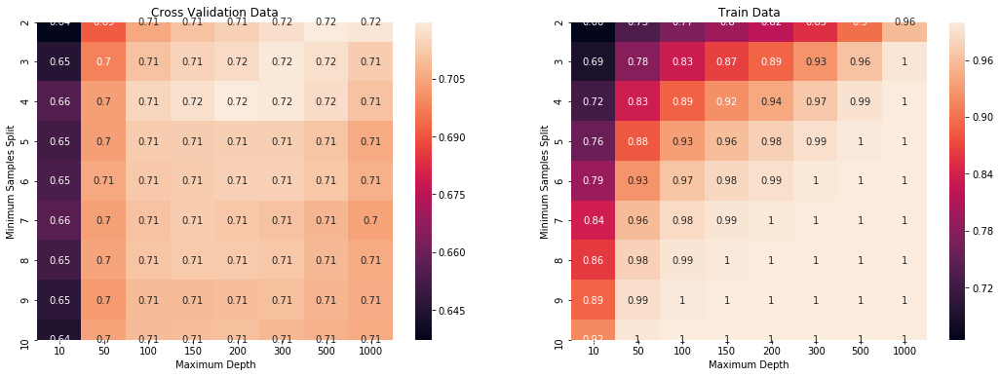

In [133]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(tfidfneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_tfidf_GB,annot = True,ax=axs[0])
sns.heatmap(trainscore_tfidf_GB,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [134]:
mx_depth_tfidf_GB = tfidf_GBneigh.best_params_['max_depth']
n_estimator_tfidf_GB = tfidf_GBneigh.best_params_['n_estimators']

In [161]:
tfidf_GBneigh.best_params_


{'max_depth': 2, 'n_estimators': 500}

### Find AUC on test and train data

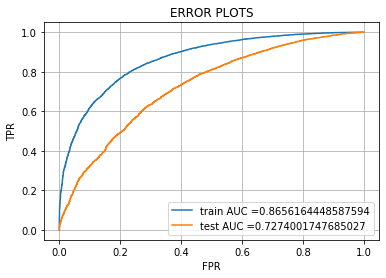

In [135]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


tfidf_GBneigh_auc = XGBClassifier(class_weight='balanced', max_depth = mx_depth_tfidf_GB, n_estimators = n_estimator_tfidf_GB ,n_jobs=-1)
tfidf_GBneigh_auc.fit(X_tfidf_GB_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_tfidf_GB_pred = tfidf_GBneigh_auc.predict_proba(X_tfidf_GB_tr)[:, 1]
y_test_tfidf_GB_pred = tfidf_GBneigh_auc.predict_proba(X_tfidf_GB_te)[:, 1]

train_tfidf_GB_fpr, train_tfidf_GB_tpr, tr_tfidf_GB_thresholds = roc_curve(y_train, y_train_tfidf_GB_pred)
test_tfidf_GB_fpr, test_tfidf_GB_tpr, te_tfidf_GB_thresholds = roc_curve(y_test, y_test_tfidf_GB_pred)

plt.plot(train_tfidf_GB_fpr, train_tfidf_GB_tpr, label="train AUC ="+str(auc(train_tfidf_GB_fpr, train_tfidf_GB_tpr)))
plt.plot(test_tfidf_GB_fpr, test_tfidf_GB_tpr, label="test AUC ="+str(auc(test_tfidf_GB_fpr, test_tfidf_GB_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 500} is 86 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 500} is 72 %</p>


### find best threshold and plot confusion matrix

In [136]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_tfidf_GBhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_tfidf_GB(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_tfidf_GB = find_best_tfidf_GBhreshold(tr_tfidf_GB_thresholds, train_tfidf_GB_fpr, train_tfidf_GB_tpr)

the maximum value of tpr*(1-fpr) 0.6160873225642662 for threshold 0.821


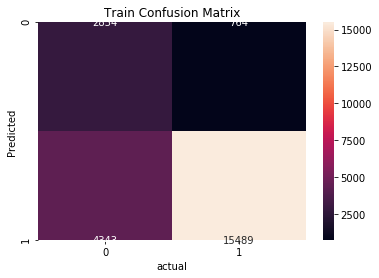

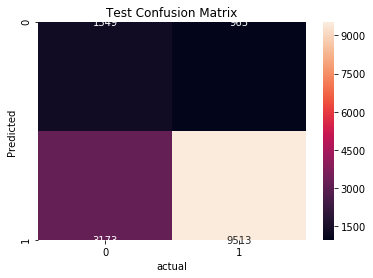

In [137]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_tfidf_GB(y_train_tfidf_GB_pred, best_tfidf_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_tfidf_GB(y_test_tfidf_GB_pred, best_tfidf_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 800} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 800} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

### 2.5.3 Applying XGBOOST on AVG W2V,<font color='red'> SET 3</font>

In [138]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

# convert array to sparse matrix https://stackoverflow.com/questions/7922487/how-to-transform-numpy-matrix-or-array-to-scipy-sparse-matrix
from scipy.sparse import hstack
X_avgw2v_GB_tr = hstack((sparse.csr_matrix(X_train_essay_sentiment_neg.T),sparse.csr_matrix(X_train_essay_sentiment_neu.T),sparse.csr_matrix(X_train_essay_sentiment_pos.T),sparse.csr_matrix(X_train_essay_sentiment_compound.T),sparse.csr_matrix(X_train_number_of_words_project_title.T),sparse.csr_matrix(X_train_number_of_words_essay.T),sparse.csr_matrix(X_train_state_rc.T),sparse.csr_matrix( X_train_teacher_rc.T),sparse.csr_matrix( X_train_grade_rc.T),sparse.csr_matrix( X_train_cleanc_rc.T),sparse.csr_matrix( X_train_cleansub_rc.T ),sparse.csr_matrix( X_train_price_norm.T ),sparse.csr_matrix( X_train_teacherposted_norm.T),X_train_avg_w2v_essay1,X_train_avg_w2v_title1)).tocsr()
X_avgw2v_GB_cr = hstack((sparse.csr_matrix(X_cv_essay_sentiment_neg.T),sparse.csr_matrix(X_cv_essay_sentiment_neu.T),sparse.csr_matrix(X_cv_essay_sentiment_pos.T),sparse.csr_matrix(X_cv_essay_sentiment_compound.T),sparse.csr_matrix(X_cv_number_of_words_project_title.T),sparse.csr_matrix(X_cv_number_of_words_essay.T),sparse.csr_matrix(X_cv_state_rc.T),sparse.csr_matrix( X_cv_teacher_rc.T),sparse.csr_matrix( X_cv_grade_rc.T),sparse.csr_matrix( X_cv_cleanc_rc.T),sparse.csr_matrix( X_cv_cleansub_rc.T ),sparse.csr_matrix( X_cv_price_norm.T ),sparse.csr_matrix( X_cv_teacherposted_norm.T),X_cv_avg_w2v_essay1,X_cv_avg_w2v_title1)).tocsr()
X_avgw2v_GB_te = hstack((sparse.csr_matrix(X_test_essay_sentiment_neg.T),sparse.csr_matrix(X_test_essay_sentiment_neu.T),sparse.csr_matrix(X_test_essay_sentiment_pos.T),sparse.csr_matrix(X_test_essay_sentiment_compound.T),sparse.csr_matrix(X_test_number_of_words_project_title.T),sparse.csr_matrix(X_test_number_of_words_essay.T),sparse.csr_matrix(X_test_state_rc.T),sparse.csr_matrix( X_test_teacher_rc.T),sparse.csr_matrix( X_test_grade_rc.T),sparse.csr_matrix( X_test_cleanc_rc.T),sparse.csr_matrix( X_test_cleansub_rc.T ),sparse.csr_matrix( X_test_price_norm.T ),sparse.csr_matrix( X_test_teacherposted_norm.T),X_test_avg_w2v_essay1,X_test_avg_w2v_title1)).tocsr()

print("Final Data matrix")
print(X_avgw2v_GB_tr.shape, y_train.shape)
print(X_avgw2v_GB_cr.shape, y_cv.shape)
print(X_avgw2v_GB_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 618) (23450,)
(11550, 618) (11550,)
(15000, 618) (15000,)


In [139]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

parametersK = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
avgw2v_GBneigh = GridSearchCV(XGBClassifier(class_weight='balanced'), parametersK, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
avgw2v_GBneigh.fit(X_avgw2v_GB_tr,y_train)
avgw2v_GBneigh.cv_results_

{'mean_fit_time': array([  22.88017941,   84.21872799,  159.19792549,  233.6666801 ,
         308.42185203,  458.65096664,  758.95544187, 1508.89077981,
          28.79742193,  117.09375962,  226.18759775,  336.92403205,
         445.16158263,  661.86995387, 1097.19796928, 2193.70308439,
          35.39559237,  151.22391955,  296.11458357,  439.87494151,
         583.79154174,  871.40633726, 1446.74476854, 2892.29162351,
          42.38022653,  186.72915928,  368.00514038,  546.10423096,
         726.18233085, 1088.00528653, 1804.00004705, 3587.56282894,
          49.18229564,  222.11461345,  438.17193572,  654.85934083,
         872.55208333, 1304.41148313, 2168.9008406 , 4169.42711711,
          55.72396048,  256.44793495,  510.27595266,  765.4531072 ,
        1019.01575089, 1517.44812616, 2481.59885422, 4519.10921168,
          62.2888972 ,  292.06764778,  582.16667716,  873.39064455,
        1156.77087005, 1705.18225519, 2692.70321051, 4718.30205425,
          69.38548509,  325.411

In [140]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_avgw2v_GB=pd.pivot_table(pd.DataFrame(avgw2v_GBneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_avgw2v_GB

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.641578,0.698221,0.712073,0.717451,0.719751,0.720473,0.719320,0.714298
3,0.656296,0.707168,0.717363,0.719630,0.720214,0.719746,0.715986,0.707008
4,0.660772,0.710775,0.716645,0.717012,0.716366,0.711963,0.705691,0.701760
5,0.662106,0.707960,0.713355,0.712769,0.711440,0.708207,0.705331,0.706393
6,0.657244,0.706649,0.712033,0.711575,0.709846,0.709390,0.709026,0.711467
7,0.652365,0.704056,0.709747,0.711221,0.710825,0.712396,0.714053,0.714814
8,0.656658,0.701078,0.704595,0.705781,0.707947,0.710637,0.713844,0.714648
9,0.656554,0.702139,0.706714,0.709959,0.712026,0.714147,0.716683,0.716410
10,0.651147,0.697244,0.705547,0.708599,0.711415,0.713783,0.715995,0.715724


In [141]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_avgw2v_GB=pd.pivot_table(pd.DataFrame(avgw2v_GBneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_avgw2v_GB

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.676012,0.749051,0.783745,0.805873,0.825682,0.857311,0.901502,0.95960
3,0.710647,0.799169,0.848640,0.883970,0.911076,0.948177,0.983361,0.99953
4,0.747589,0.860299,0.922079,0.957481,0.977489,0.994384,0.999852,1.00000
5,0.796061,0.924040,0.976582,0.993208,0.998431,0.999966,1.000000,1.00000
6,0.851535,0.972846,0.997245,0.999845,0.999996,1.000000,1.000000,1.00000
7,0.900917,0.995294,0.999961,1.000000,1.000000,1.000000,1.000000,1.00000
8,0.932928,0.999559,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000
9,0.965206,0.999989,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000
10,0.979236,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000


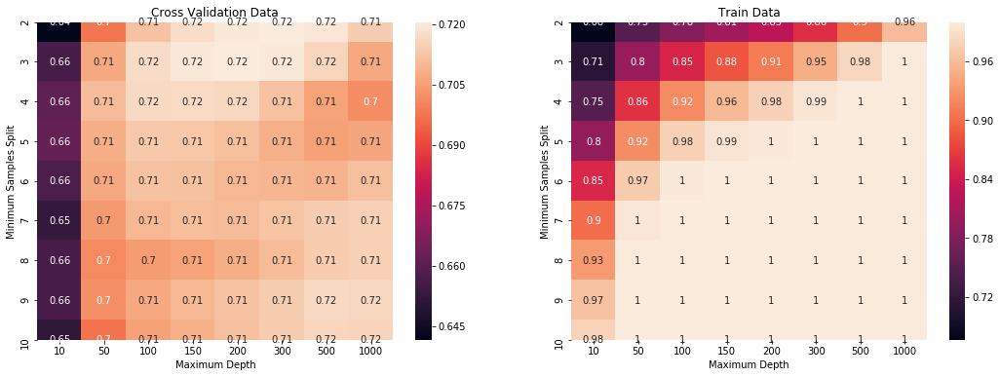

In [142]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

#testscore = pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),
#    values='mean_test_score', index='param_max_depth', columns='param_min_samples_split')

#trainscore = pd.pivot_table(pd.DataFrame(avgw2vneigh.cv_results_),
#    values='mean_train_score', index='param_max_depth', columns='param_min_samples_split')

# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_avgw2v_GB,annot = True,ax=axs[0])
sns.heatmap(trainscore_avgw2v_GB,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [143]:
avgw2v_GBneigh.best_params_
mx_depth_avgw2v_GB = avgw2v_GBneigh.best_params_['max_depth']
n_estimator_avgw2v_GB = avgw2v_GBneigh.best_params_['n_estimators']

In [162]:
avgw2v_GBneigh.best_params_


{'max_depth': 2, 'n_estimators': 300}

### Find AUC on test and train data

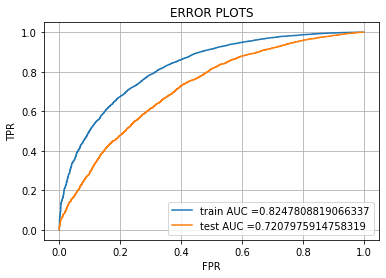

In [144]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


avgw2v_GBneigh_auc = XGBClassifier(class_weight='balanced', max_depth = mx_depth_avgw2v_GB, n_estimators = n_estimator_avgw2v_GB,n_jobs=-1)
avgw2v_GBneigh_auc.fit(X_avgw2v_GB_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_avgw2v_GB_pred = avgw2v_GBneigh_auc.predict_proba(X_avgw2v_GB_tr)[:, 1]
y_test_avgw2v_GB_pred = avgw2v_GBneigh_auc.predict_proba(X_avgw2v_GB_te)[:, 1]

train_avgw2v_GB_fpr, train_avgw2v_GB_tpr, tr_avgw2v_GB_thresholds = roc_curve(y_train, y_train_avgw2v_GB_pred)
test_avgw2v_GB_fpr, test_avgw2v_GB_tpr, te_avgw2v_GB_thresholds = roc_curve(y_test, y_test_avgw2v_GB_pred)

plt.plot(train_avgw2v_GB_fpr, train_avgw2v_GB_tpr, label="train AUC ="+str(auc(train_avgw2v_GB_fpr, train_avgw2v_GB_tpr)))
plt.plot(test_avgw2v_GB_fpr, test_avgw2v_GB_tpr, label="test AUC ="+str(auc(test_avgw2v_GB_fpr, test_avgw2v_GB_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 300} is 82 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 2, 'n_estimators': 300} is 72 %</p>


### find best threshold and plot confusion matrix

In [145]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_avgw2v_GBhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_avgw2v_GB(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_avgw2v_GB = find_best_avgw2v_GBhreshold(tr_avgw2v_GB_thresholds, train_avgw2v_GB_fpr, train_avgw2v_GB_tpr)

the maximum value of tpr*(1-fpr) 0.5521598397238852 for threshold 0.819


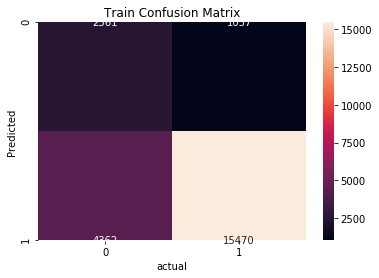

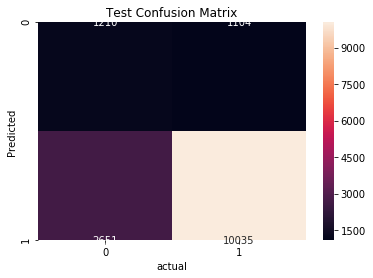

In [146]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_avgw2v_GB(y_train_avgw2v_GB_pred, best_avgw2v_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_avgw2v_GB(y_test_avgw2v_GB_pred, best_avgw2v_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 300} is not a sensible model as TNR rates are very low for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 2, 'n_estimators': 300} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

### 2.5.4 Applying XGBOOST on TFIDF W2V,<font color='red'> SET 4</font>

In [147]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

# convert array to sparse matrix https://stackoverflow.com/questions/7922487/how-to-transform-numpy-matrix-or-array-to-scipy-sparse-matrix
from scipy.sparse import hstack
X_tfidfw2v_GB_tr = hstack((sparse.csr_matrix(X_train_essay_sentiment_neg.T),sparse.csr_matrix(X_train_essay_sentiment_neu.T),sparse.csr_matrix(X_train_essay_sentiment_pos.T),sparse.csr_matrix(X_train_essay_sentiment_compound.T),sparse.csr_matrix(X_train_number_of_words_project_title.T),sparse.csr_matrix(X_train_number_of_words_essay.T),sparse.csr_matrix(X_train_state_rc.T),sparse.csr_matrix( X_train_teacher_rc.T),sparse.csr_matrix( X_train_grade_rc.T),sparse.csr_matrix( X_train_cleanc_rc.T),sparse.csr_matrix( X_train_cleansub_rc.T ),sparse.csr_matrix( X_train_price_norm.T ),sparse.csr_matrix( X_train_teacherposted_norm.T),X_train_tfidf_w2v_essay1,X_train_tfidf_w2v_title1)).tocsr()
X_tfidfw2v_GB_cr = hstack((sparse.csr_matrix(X_cv_essay_sentiment_neg.T),sparse.csr_matrix(X_cv_essay_sentiment_neu.T),sparse.csr_matrix(X_cv_essay_sentiment_pos.T),sparse.csr_matrix(X_cv_essay_sentiment_compound.T),sparse.csr_matrix(X_cv_number_of_words_project_title.T),sparse.csr_matrix(X_cv_number_of_words_essay.T),sparse.csr_matrix(X_cv_state_rc.T),sparse.csr_matrix( X_cv_teacher_rc.T),sparse.csr_matrix( X_cv_grade_rc.T),sparse.csr_matrix( X_cv_cleanc_rc.T),sparse.csr_matrix( X_cv_cleansub_rc.T ),sparse.csr_matrix( X_cv_price_norm.T ),sparse.csr_matrix( X_cv_teacherposted_norm.T),X_cv_tfidf_w2v_essay1,X_cv_tfidf_w2v_title1)).tocsr()
X_tfidfw2v_GB_te = hstack((sparse.csr_matrix(X_test_essay_sentiment_neg.T),sparse.csr_matrix(X_test_essay_sentiment_neu.T),sparse.csr_matrix(X_test_essay_sentiment_pos.T),sparse.csr_matrix(X_test_essay_sentiment_compound.T),sparse.csr_matrix(X_test_number_of_words_project_title.T),sparse.csr_matrix(X_test_number_of_words_essay.T),sparse.csr_matrix(X_test_state_rc.T),sparse.csr_matrix( X_test_teacher_rc.T),sparse.csr_matrix( X_test_grade_rc.T),sparse.csr_matrix( X_test_cleanc_rc.T),sparse.csr_matrix( X_test_cleansub_rc.T ),sparse.csr_matrix( X_test_price_norm.T ),sparse.csr_matrix( X_test_teacherposted_norm.T),X_test_tfidf_w2v_essay1,X_test_tfidf_w2v_title1)).tocsr()

print("Final Data matrix")
print(X_tfidfw2v_GB_tr.shape, y_train.shape)
print(X_tfidfw2v_GB_cr.shape, y_cv.shape)
print(X_tfidfw2v_GB_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(23450, 618) (23450,)
(11550, 618) (11550,)
(15000, 618) (15000,)


In [148]:
parametersK1 = {'max_depth':[2, 3, 4, 5, 6, 7, 8, 9, 10],'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]}
tfidfw2v_GBneigh = GridSearchCV(RandomForestClassifier(class_weight='balanced'), parametersK1, cv=3, scoring = 'roc_auc',return_train_score=True,n_jobs=-1)
tfidfw2v_GBneigh.fit(X_tfidfw2v_GB_tr,y_train)
tfidfw2v_GBneigh.cv_results_

{'mean_fit_time': array([  2.0363915 ,   6.14580909,  11.20309504,  16.35937476,
         21.39061753,  32.33331911,  53.21878489, 105.1041712 ,
          2.34896564,   8.67166273,  16.64055785,  24.69791587,
         32.54686912,  49.02082467,  80.86981209, 160.19793701,
          2.83856956,  11.73957849,  22.67621827,  33.76040538,
         44.82813557,  67.26039616, 112.89576976, 222.37484193,
          3.67702222,  15.49999992,  30.30208055,  45.02605605,
         59.84376876,  89.04172254, 148.90099271, 296.24483792,
          4.48959001,  19.8749977 ,  38.99998999,  58.99995955,
         77.05732059, 115.20314288, 193.02608673, 386.14575736,
          5.52604032,  25.31246956,  50.13542755,  74.06768076,
         97.88545275, 146.61448232, 243.92700545, 490.59900991,
          7.36457443,  30.92711298,  60.97395078,  90.91660738,
        121.52085733, 183.0729382 , 304.28128759, 605.47388697,
          7.87495542,  36.93229882,  73.58330949, 109.06769164,
        145.96341801, 2

In [149]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

testscore_w2v_GB=pd.pivot_table(pd.DataFrame(tfidfw2v_GBneigh.cv_results_),values='mean_test_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Test Score")
testscore_w2v

Mean Test Score


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.632399,0.670451,0.672285,0.673658,0.676655,0.674303,0.676770,0.676750
3,0.643025,0.670348,0.680466,0.680938,0.680824,0.682310,0.682938,0.684263
4,0.649115,0.677308,0.685975,0.684342,0.688622,0.688339,0.688265,0.689770
5,0.658577,0.681457,0.686948,0.688026,0.690771,0.691580,0.691726,0.691463
6,0.645452,0.684021,0.688393,0.687825,0.690281,0.691304,0.692614,0.692989
7,0.652244,0.680416,0.688368,0.690193,0.691904,0.691417,0.691812,0.693270
8,0.648511,0.678369,0.686071,0.689427,0.689147,0.690667,0.690615,0.691855
9,0.632700,0.675853,0.684985,0.687960,0.689574,0.690471,0.691030,0.691576
10,0.641670,0.674792,0.685003,0.684939,0.686558,0.687321,0.690524,0.690900


In [150]:
# seaborn heatmap gridsearchcv https://stackoverflow.com/questions/48791709/how-to-plot-a-heat-map-on-pivot-table-after-grid-search

trainscore_w2v_GB=pd.pivot_table(pd.DataFrame(tfidfw2v_GBneigh.cv_results_),values='mean_train_score',index='param_max_depth',columns='param_n_estimators')
print("Mean Train SCore")
trainscore_w2v

Mean Train SCore


param_n_estimators,10,50,100,150,200,300,500,1000
param_max_depth,,,,,,,,
2,0.663983,0.701056,0.706824,0.709687,0.713012,0.710376,0.712209,0.712843
3,0.696649,0.723577,0.737607,0.735807,0.734622,0.735332,0.737331,0.739128
4,0.720965,0.759134,0.767956,0.768052,0.772770,0.770803,0.772190,0.773508
5,0.763017,0.802405,0.812288,0.815860,0.815209,0.816657,0.818973,0.817911
6,0.808476,0.855270,0.864568,0.866396,0.868666,0.870836,0.871529,0.872707
7,0.854984,0.912679,0.916872,0.922006,0.921356,0.923125,0.923846,0.925180
8,0.900485,0.950023,0.959083,0.961057,0.961655,0.964184,0.965986,0.965870
9,0.932284,0.978801,0.983495,0.985939,0.985922,0.987063,0.988153,0.988658
10,0.956599,0.992033,0.995123,0.995720,0.996275,0.996657,0.996894,0.997039


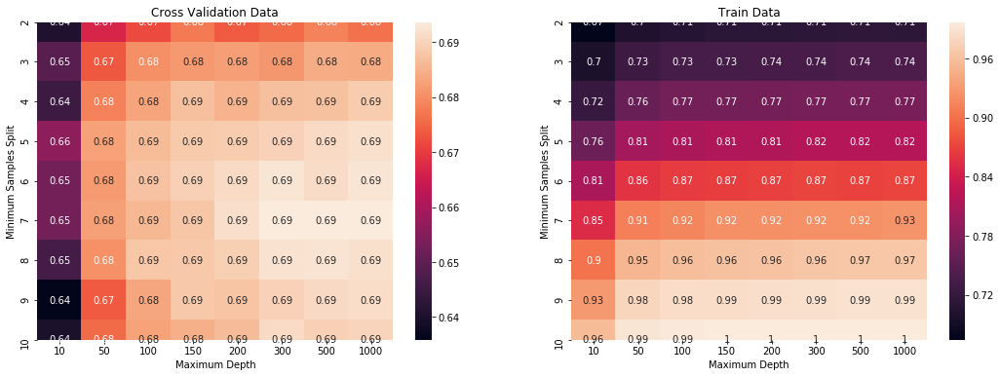

In [151]:
# print sns plot multiple plots  https://stackoverflow.com/questions/38082602/plotting-multiple-different-plots-in-one-figure-using-seaborn
fig, axs = plt.subplots(ncols=2,figsize=(18,6))
sns.heatmap(testscore_w2v_GB,annot = True,ax=axs[0])
sns.heatmap(trainscore_w2v_GB,annot = True,ax=axs[1])

axs[0].set(title='Cross Validation Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')
axs[1].set(title='Train Data',xlabel='Maximum Depth', ylabel='Minimum Samples Split')

plt.show()


In [152]:
tfidfw2v_GBneigh.best_params_

{'max_depth': 7, 'n_estimators': 500}

In [153]:
mx_depth_tfidf_w2v_GB = tfidfneigh.best_params_['max_depth']
n_estimator_tfidf_w2v_GB = tfidfneigh.best_params_['n_estimators']

### Find AUC on test and train data

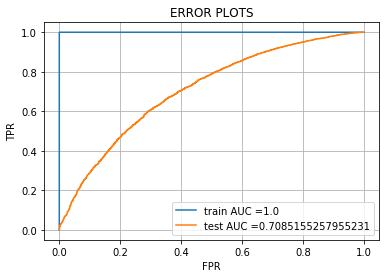

In [154]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc


tfidfw2v_GBneigh_auc = XGBClassifier(class_weight='balanced',max_depth = mx_depth_tfidf_w2v_GB, n_estimators = n_estimator_tfidf_w2v_GB,n_jobs=-1)
tfidfw2v_GBneigh_auc.fit(X_tfidfw2v_GB_tr, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_tfidfw2v_GB_pred = tfidfw2v_GBneigh_auc.predict_proba(X_tfidfw2v_GB_tr)[:, 1]
y_test_tfidfw2v_GB_pred = tfidfw2v_GBneigh_auc.predict_proba(X_tfidfw2v_GB_te)[:, 1]

train_tfidfw2v_GB_fpr, train_tfidfw2v_GB_tpr, tr_tfidfw2v_GB_thresholds = roc_curve(y_train, y_train_tfidfw2v_GB_pred)
test_tfidfw2v_GB_fpr, test_tfidfw2v_GB_tpr, te_tfidfw2v_GB_thresholds = roc_curve(y_test, y_test_tfidfw2v_GB_pred)

plt.plot(train_tfidfw2v_GB_fpr, train_tfidfw2v_GB_tpr, label="train AUC ="+str(auc(train_tfidfw2v_GB_fpr, train_tfidfw2v_GB_tpr)))
plt.plot(test_tfidfw2v_GB_fpr, test_tfidfw2v_GB_tpr, label="test AUC ="+str(auc(test_tfidfw2v_GB_fpr, test_tfidfw2v_GB_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Observations:
<p>Train Accuray with Hyper Parameter {'max_depth': 7, 'n_estimators': 500} is 100 %</p>
<p>Test Accuray with Hyper Parameter {'max_depth': 7, 'n_estimators': 500} is 70 %</p>


### find best threshold and plot confusion matrix

In [155]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_tfidfw2v_GBhreshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_tfidfw2v_GB(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions
	
print("="*100)
from sklearn.metrics import confusion_matrix
best_tfidfw2v_GB = find_best_tfidfw2v_GBhreshold(tr_tfidfw2v_GB_thresholds, train_tfidfw2v_GB_fpr, train_tfidfw2v_GB_tpr)

the maximum value of tpr*(1-fpr) 1.0 for threshold 0.918


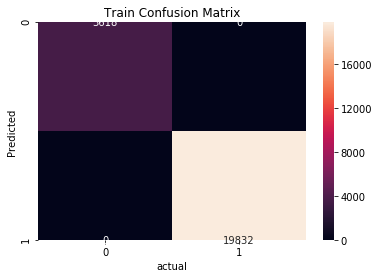

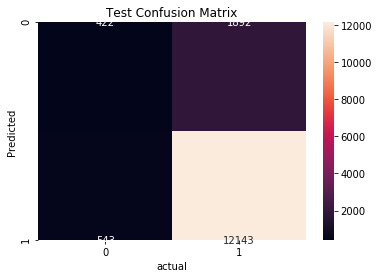

In [159]:
#heatmap confusion matrix https://stackoverflow.com/questions/35572000/how-can-i-plot-a-confusion-matrix

confusion = confusion_matrix(y_train, predict_with_best_tfidfw2v_GB(y_train_tfidfw2v_GB_pred, best_tfidfw2v_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Train Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

confusion = confusion_matrix(y_test, predict_with_best_tfidfw2v_GB(y_test_tfidfw2v_GB_pred, best_tfidfw2v_GB))
df_cm1=pd.DataFrame(confusion)
sns.heatmap(df_cm1,annot=True,fmt="d")

plt.title ("Test Confusion Matrix")
plt.ylabel("Predicted")
plt.xlabel("actual")
plt.show()

## Observations:
<p> RF model with hyper parameter {'max_depth': 7, 'n_estimators': 500} is sensible model as TNR and TPR  rates are high for Train confusion matrix</p>
<p> RF model with hyper parameter {'max_depth': 7, 'n_estimators': 500} is not a sensible model as TNR rates are very low for Test confusion matrix</p>

<h1>3. Conclusion</h1>

In [184]:
from prettytable import PrettyTable
    
Finaloutput = PrettyTable()
Finaloutput1 = PrettyTable()

Finaloutput.field_names = ["Vectorizer", "Model", "Max Depth", "N_Estimators","AUC"]

Finaloutput.add_row(["BOW", "Random Forest", 10, 1000,str((auc(train_bow_fpr, train_bow_tpr)))])
Finaloutput.add_row(["TFIDF", "Random Forest", "10", 1000,str(auc(train_tfidf_fpr, train_tfidf_tpr))])
Finaloutput.add_row(["AVGW2V", "Random Forest", "08", 1000,str(auc(train_avgw2v_fpr, train_avgw2v_tpr))])
Finaloutput.add_row(["TFIDFW2V", "Random Forest", "07", 1000,str(auc(train_tfidfw2v_fpr, train_tfidfw2v_tpr))])
print(Finaloutput)

Finaloutput1.field_names = ["Vectorizer", "Model", "Max Depth", "N_Estimators","AUC"]

Finaloutput1.add_row(["BOW", "XGBOOST", "02", 500,str((auc(train_bow_GB_fpr, train_bow_GB_tpr)))])
Finaloutput1.add_row(["TFIDF", "XGBOOST", "02", 500,str(auc(train_tfidf_GB_fpr, train_tfidf_GB_tpr))])
Finaloutput1.add_row(["AVGW2V", "XGBOOST", "02", 300,str(auc(train_avgw2v_GB_fpr, train_avgw2v_GB_tpr))])
Finaloutput1.add_row(["TFIDFW2V", "XGBOOST", "07", 500,str(auc(train_tfidfw2v_GB_fpr, train_tfidfw2v_GB_tpr))])


print(Finaloutput1)

+------------+---------------+-----------+--------------+--------------------+
| Vectorizer |     Model     | Max Depth | N_Estimators |        AUC         |
+------------+---------------+-----------+--------------+--------------------+
|    BOW     | Random Forest |     10    |     1000     | 0.8780265981062373 |
|   TFIDF    | Random Forest |     10    |     1000     | 0.8944433963926056 |
|   AVGW2V   | Random Forest |     08    |     1000     | 0.9527418374043457 |
|  TFIDFW2V  | Random Forest |     07    |     1000     | 0.8870879957703304 |
+------------+---------------+-----------+--------------+--------------------+
+------------+---------+-----------+--------------+--------------------+
| Vectorizer |  Model  | Max Depth | N_Estimators |        AUC         |
+------------+---------+-----------+--------------+--------------------+
|    BOW     | XGBOOST |     02    |     500      | 0.8339053996076717 |
|   TFIDF    | XGBOOST |     02    |     500      | 0.8656164448587594 |
|  

## Observation
<p> AVGW2V  vetorizer has given more AUC score compare with other Random Forest Vectorizers with the Hyper Parameters (Max Depth: 08 and N_Estimator: 1000) using Random Forest</p>
<p> TFIDFW2V  vetorizer has given more AUC score compare with other XGBOOST Vectorizers with the Hyper Parameters (Max Depth: 07 and N_Estimator: 500) using XGBOOST</p>

<p>XGBOOST has given more accuracy score than Random Forest/p>